In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
import warnings
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
import xgboost as xgb
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import LabelEncoder
import shap
import glob


# Define the directory path where the CSV files are located
input_path =r'../data/promice/preprocessed/daily/'
pattern = '*.csv'
#staion_list = ['SCO_L.csv','KAN_L.csv']

# Use glob to get a list of all files that match the pattern
filenames = glob.glob(input_path + pattern)


data_collection = []
for file in filenames:
    data = pd.read_csv(file, index_col=False)
    data_collection.append(data)
data = pd.concat(data_collection)

data = data.reset_index(drop=True)


#data = pd.read_csv('../data//promice/preprocessed/daily/SCO_L.csv')
data = data.drop(['Unnamed: 0','Surface height from combined measurements DELTA', 'Surface height from combined measurements'], axis=1)
data['Datetime'] = pd.to_datetime(data['Datetime'], format='%Y-%m-%d')

In [2]:
# Defining stations
#display(data['stid'].unique())

#promice_stations = [
#    "KPC_L", "KPC_Lv3", "KPC_U", "KPC_Uv3", "SCO_L", "SCO_U", "MIT", "TAS_L",
#    "TAS_U", "TAS_A", "QAS_L", "QAS_Lv3", "QAS_U", "QAS_Uv3", "QAS_A", "NUK_L",
#    "NUK_U", "NUK_Uv3", "NUK_K", "NUK_N", "KAN_B", "KAN_L", "KAN_M", "KAN_U",
#    "UPE_L", "UPE_U", "THU_L", "THU_L2", "THU_U", "THU_U2", "CEN", "CEN1",
#3    "SWC", "SWC_O", "JAR", "JAR_O", "EGP"
#]
promice_stations = [
    "KPC_L", "KPC_Lv3", "KPC_Uv3", "SCO_L", "SCO_U", "MIT", "TAS_L",
    "TAS_U", "TAS_A", "QAS_L", "QAS_Lv3", "QAS_U", "QAS_Uv3", "QAS_A", "NUK_L",
    "NUK_U", "NUK_K", "KAN_B", "KAN_L", "KAN_M", "KAN_U",
    "UPE_L", "UPE_U", "THU_L", "THU_U", "THU_U2", "CEN", "CEN1",
    "SWC_O", "JAR_O", "EGP"
]
promice_stations = ['KPC_L','SCO_L','SCO_U','THU_L','UPE_L','UPE_U','MIT',
                    'TAS_L','KAN_L','NUK_L','NUK_U','QAS_L','QAS_U']

# Removed stations due to lagging years
# THU_L2, SWC, NUK_Uv3, NUK_N, KPC_U, JAR
length_of_list = len(promice_stations)
data = data.loc[data['stid'].isin(promice_stations)]

#KPC_LSCO_LSCO_UTHU_L UPE_L UPE_U MIT TAS_L KAN_L NUK_L NUK_U QAS_L QAS_U



print(data.columns)
print(data.shape)

Index(['stid', 'Datetime', 'Air pressure (upper boom)',
       'Air temperature (upper boom)',
       'Relative humidity (upper boom) - corrected',
       'Specific humidity (upper boom)', 'Wind speed (upper boom)',
       'Wind from direction (upper boom)',
       'Downwelling shortwave radiation - corrected',
       'Upwelling shortwave radiation - corrected',
       'Downwelling longwave radiation', 'Upwelling longwave radiation',
       'Surface temperature', 'Latent heat flux (upper boom)',
       'Sensible heat flux (upper boom)', 'Albedo', 'Cloud cover', 'Ablation',
       'Melting Season'],
      dtype='object')
(68587, 19)


In [3]:

def add_features(data):
    df = data.copy()
    df['DayOfYear'] = df['Datetime'].dt.dayofyear
    df['Year'] = df['Datetime'].dt.year
    return df

data = add_features(data)


In [4]:
for station in data['stid'].unique():
    print(station, data.loc[data['stid'] == station,'Year'].unique())

KAN_L [2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021
 2022 2023]
KPC_L [2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021
 2022 2023]
MIT [2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021 2022
 2023]
NUK_L [2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021 2022 2023]
NUK_U [2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021 2022]
QAS_L [2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021 2022 2023]
QAS_U [2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021
 2022 2023]
SCO_L [2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021
 2022 2023]
SCO_U [2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021
 2022 2023]
TAS_L [2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021 2022 2023]
THU_L [2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021 2022 2023]
UPE_L [2009 2010 2011 20

# Calculating Melt Season Start

In [5]:
def create_lagged_features(df, n_lags):

    lagged_df = pd.DataFrame()
    

    for i in df.columns:
        for j in range(1,n_lags+1):
            lagged_df[f'{i}_lag_{j}'] = df[i].shift(j).copy()

    return lagged_df.copy()

# function that populates event and time to event data
def  time_to_event_calc(df, year_data, event):
    
    #print(df.loc[df.index.year].shape)
    print(year_data['Year'].unique()[0])
    

    return df



def results_summary(df, results, station):
    results_df = results.copy()
    #if station == 'MIT':
    #    display(results_df.loc[results_df['stid'] == 'MIT'][100:200])
    df_stat = df.loc[df['stid'] == station].index
    results_df = results_df.loc[results_df.index.intersection(df_stat)]
    #results_df = results_df.loc[df.loc[df['stid'] == 'KAN_L'].index]
    
    #results_df = results_df.loc[results.index]
    results_df['pred_date'] = results_df['DayOfYear'] + results_df['xgb_pred']
    results_df['event'] = df['event']
    results_df['event_date'] = 0
    test_years = results_df['Datetime'].dt.year.unique()
    results_df.set_index(results_df['Datetime'], inplace=True)
    #print(test_years)

    

#display(results)
    #weekly_data = results_df['pred_date'].resample('W').mean() 
    monthly_data = results_df['pred_date'].resample('M').mean().round(1)
    quarterly_data = results_df['pred_date'].resample('Q').mean().round(1)
    yearly_data = results_df['pred_date'].resample('Y').mean().round(1)

    result_agg = pd.concat([monthly_data, quarterly_data,yearly_data], axis=1,keys=['Monthly','Quarterly','Yearly'])
    result_agg = result_agg.merge(results_df['event_date'], how='left',left_index=True,right_index=True)
    result_agg = result_agg.loc[((result_agg.index.year).isin(test_years))]

    result_agg = result_agg.dropna(how='all')
    #print(test_years)
    for year in test_years:
        #if station == 'MIT' and year == 2012:
            #print('station', station,'year',year)
        #    display(results_df.loc[(results_df['Year'] == year)])
        event = results_df.loc[(results_df['Year'] == year) & (results_df['event'] == 1),'DayOfYear']
        #print(year, event)
        #display(result_agg.loc[result_agg.index.year == year])
        try:
            result_agg.loc[result_agg.index.year == year,['event_date']] = int(event)
        except:
            pass
    
    result_agg[''] = '|'
    result_agg['Month_diff'] = (result_agg['Monthly'] - result_agg['event_date']).round(1)
    result_agg['Quarter_diff'] = (result_agg['Quarterly'] - result_agg['event_date']).round(1)
    result_agg['Year_diff'] = (result_agg['Yearly'] - result_agg['event_date']).round(1)

    result_agg.index = result_agg.index.strftime('%Y-%m-%d')
    result_agg.fillna('',inplace=True)

    return result_agg


def results_summary_new(df, results):
    results_df = results.copy()


    results_df['pred_date'] = results_df['Datetime'] + pd.to_timedelta(results_df['xgb_pred'], unit='D')
    results_df['pred_date_DOY'] = results_df['DayOfYear'] + results_df['xgb_pred']
    results_df['event'] = df['event']
    results_df['event_date'] = 0
    results_df.set_index(results_df['Datetime'], inplace=True)
    #display(results_df)

    test_years = results['Datetime'].dt.year.unique()


    # Date data 
    monthly_data = results_df['pred_date'].resample('M').apply(lambda x: pd.to_datetime(x.astype('int64').mean()))
    quarterly_data = results_df['pred_date'].resample('Q').apply(lambda x: pd.to_datetime(x.astype('int64').mean()))
    yearly_data = results_df['pred_date'].resample('Y').apply(lambda x: pd.to_datetime(x.astype('int64').mean()))

    result_agg = pd.concat([monthly_data, quarterly_data, yearly_data], axis=1, keys=['Monthly', 'Quarterly', 'Yearly'])
    result_agg = result_agg.merge(results_df['event_date'], how='left', left_index=True, right_index=True)
    result_agg = result_agg.loc[((result_agg.index.year).isin(test_years))]

    # Day of Year data
    #monthly_data = results_df['pred_date_DOY'].resample('M').mean()
    #quarterly_data = results_df['pred_date_DOY'].resample('Q').mean()
    #yearly_data = results_df['pred_date_DOY'].resample('Y').mean()
    #print(yearly_data)

    #result_agg_DOY = pd.concat([monthly_data, quarterly_data,yearly_data], axis=1,keys=['Monthly','Quarterly','Yearly'])
    #result_agg_DOY = result_agg.merge(results_df['event_date'], how='left',left_index=True,right_index=True)
    #result_agg_DOY = result_agg.loc[((result_agg.index.year).isin(test_years))]
    #display(result_agg_DOY)

    result_agg = result_agg.dropna(how='all')
    result_agg_DOY = result_agg.dropna(how='all')

    for year in test_years:
        event = results_df.loc[(results_df['Year'] == year) & (results_df['event'] == 1)].index
        #print(event)
        #event = results_df.loc[(results_df['Year'] == year) & (results_df['event'] == 1), 'DayOfYear']
        #print(event)
        result_agg.loc[result_agg.index.year == year, ['event_date']] = pd.to_datetime(event)
    #display(result_agg)
        #result_agg_DOY.loc[result_agg.index.year == year,['event_date']] = int(event)
    result_agg['event_date'] = pd.to_datetime(result_agg['event_date'])
    result_agg[''] = '|'
    result_agg['Month_diff'] = (result_agg['Monthly'].dt.tz_localize(None) - result_agg['event_date'].dt.tz_localize(None)).apply(lambda x: x.days)
    result_agg['Quarter_diff'] = (result_agg['Quarterly'].dt.tz_localize(None) - result_agg['event_date'].dt.tz_localize(None)).apply(lambda x: x.days)
    result_agg['Year_diff'] = (result_agg['Yearly'].dt.tz_localize(None) - result_agg['event_date'].dt.tz_localize(None)).apply(lambda x: x.days)
    for col in result_agg.columns:
        try:
            result_agg[col] = result_agg[col].strftime('%Y-%m-%d')
        except:
            pass

    result_agg.index = result_agg.index.strftime('%Y-%m-%d')
    #result_agg.fillna('', inplace=True)
    #for col in result_agg.columns:
    #    result_agg[col] - result_agg[col].apply(lambda x: np.nan if pd.isnull(x) else x)
    result_agg.replace({np.nan:'',pd.NaT:''}, inplace = True)
    
    return result_agg



def summarize_results_by_stid(df, results):
    combined_results = []
    enum = 0
    for station in df['stid'].unique():
        station_df = results_summary(df, results, station)
        station_df['stid' + str(enum)] = station
        combined_results.append(station_df)
        enum += 1 

    combined_df = pd.concat(combined_results, axis=1)
    combined_df.fillna('')
    return combined_df

#summary = summarize_results_by_stid(df, results)
#display(summary.head(30))
#summary = summarize_results_by_stid(df, results)
#for i in df['stid'].unique():
#    print('STATION:', i)
#    summary = results_summary(df, results, i)
#    display(summary)
#summary = summary = results_summary(df, results, 'MIT')

#display(df.loc[(df['stid'] == 'MIT') & (df['Year'] == 2012)])
#print(df.loc[df['stid'] == 'MIT','Year'].unique())
#display(results.loc[(results['stid'] == 'MIT') & (results['Year'] == 2012)])

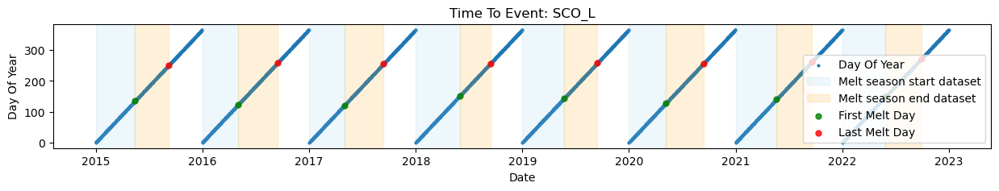

In [6]:
import matplotlib.patches as mpatches
import matplotlib.dates as mdates

def period_viz(df, station, date_range=None):
    df_stat = df.loc[df['stid'] == station]
    max_year, min_year = df_stat['Year'].max(), df_stat['Year'].min()
    df_stat = df_stat.loc[(df_stat['Year'] >= 2015) & (df_stat['Year'] <= 2022)]
    years = df_stat['Year'].unique()
    melt_season_start_dates, melt_season_end_dates, first_day_of_year = [], [], []

    for year in years:
        df_year = df_stat.loc[df_stat['Year'] == year]

        melt_season_start_dates.append(df_year.loc[df_year['Ablation'] == True]['Datetime'].min())
        melt_season_end_dates.append(df_year.loc[df_year['Ablation'] == True]['Datetime'].max())
        first_day_of_year.append(df_year.loc[df_year['DayOfYear'] == 1]['Datetime'].max())

    fig, ax = plt.subplots(figsize=(15, 2))

    # Plot the blue scatter points
    plt.scatter(df_stat['Datetime'], df_stat['DayOfYear'], c='C0', marker='.', label='Day Of Year', s=15)

    for first_day, last_day in zip(first_day_of_year, melt_season_start_dates):
        ax.axvspan(first_day, last_day, alpha=0.15, color='skyblue', label='Melt season start dataset' if first_day == first_day_of_year[0] else "")

    for first_day, last_day in zip(melt_season_start_dates, melt_season_end_dates):
        ax.axvspan(first_day, last_day, alpha=0.15, color='orange', label='Melt season end dataset' if first_day == melt_season_start_dates[0] else "")

    # Plot the first melt day values
    plt.scatter(melt_season_start_dates, df_stat.loc[df_stat['Datetime'].isin(melt_season_start_dates), 'DayOfYear'], c='g', alpha=0.8, marker='.', label='First Melt Day', s=100)

    # Plot the last melt day values
    plt.scatter(melt_season_end_dates, df_stat.loc[df_stat['Datetime'].isin(melt_season_end_dates), 'DayOfYear'], c='r', alpha=0.8, marker='.', label='Last Melt Day', s=100)

    # set plot title, axis labels and legend
    ax.set_title(f'Time To Event: {station}')
    ax.set_xlabel('Date')
    ax.set_ylabel('Day Of Year')
    ax.legend(loc='lower right')


    if date_range:
        ax.set_xlim(date_range)

    years_fmt = mdates.YearLocator()
    ax.xaxis.set_major_locator(years_fmt)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    # Save the plot in the Downloads folder
    # plot_filename = f'Surface_Height_{stid}.png'
    # plt.savefig(os.path.join(os.path.expanduser("~"), "Downloads", plot_filename), dpi=300)

    plt.show()

# Set the datetime range to display by passing the date_range argument as a tuple (start_date, end_date)
# For example: date_range=('2010-01-01', '2020-12-31')
period_viz(data, 'SCO_L', date_range=None)


In [7]:
from sklearn.preprocessing import LabelEncoder
from feature_engine.creation import CyclicalFeatures

warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

def preprocessing_melt(data, start_end='start', lags=False, exclude_nan=False):
    # Preprocessing 
    df = data.copy()
    #print(df.info())
    #df[['Latent heat flux (upper boom)','Sensible heat flux (upper boom)','Albedo']] = df[['Latent heat flux (upper boom)','Sensible heat flux (upper boom)','Albedo']].bfill()   
    df['Albedo'] = df['Albedo'].bfill()
    #create event and time to event columns
    df['event'] = 0
    df['event_True'] = 0
    df.loc[:,'event_True'] = True
    df['time_to_event'] = 0
    #print(df['Albedo'].isna().sum())
    ## SCALING 

    cyclical = CyclicalFeatures(variables=None, drop_original=True)
    df_wind = df[df['Wind from direction (upper boom)'].notna()] 
    cyclical_df = cyclical.fit_transform(df_wind[['Wind from direction (upper boom)']]) 

    df = df.merge(cyclical_df, how='left',left_index=True,right_index=True)
    df.drop('Wind from direction (upper boom)', axis=1, inplace=True)

    #df = pd.merge(df, cyclical_features, how='left', left_index = True, right_index=True)

    # min/max scaling
    train_columns = df.drop(['stid','Datetime','Ablation','Melting Season','Year','time_to_event', 'DayOfYear', 'event', 'event_True', 'DayOfYear', 'Wind from direction (upper boom)_cos', 'Wind from direction (upper boom)_sin'],axis=1).columns


    scaler = MinMaxScaler()
    df[train_columns] = scaler.fit_transform(df[train_columns])

    train_columns = train_columns.append(df[['Wind from direction (upper boom)_cos', 'Wind from direction (upper boom)_sin']].columns)


    # include lags if not False and specify features/target columns
    if type(lags) == int:
        lagged_features = create_lagged_features(df[train_columns], lags)
        features = pd.merge(df[train_columns], lagged_features, how='left', left_index=True, right_index=True)

    elif not lags:
        features = df[train_columns].copy()
    else:
        raise ValueError('Lags input not accepted, needs to be False or int')
    


    #display(features)
    #display(df)
    label_encoder = LabelEncoder()
    label_df = pd.DataFrame()
    label_df.index = df.index.copy()
    label_df['station_encoded'], label_df['year_encoded'] = label_encoder.fit_transform(df['stid']), label_encoder.fit_transform(df['Year'])
    features['year_encoded'], features['station_encoded'] = label_df['year_encoded'], label_df['station_encoded']
    #features[['year_encoded','station_encoded']] = scaler.fit_transform(features[['year_encoded','station_encoded']])
    
    #display(features)
    
    # calculate event date and time to event per year
    for station in df['stid'].unique():

        unique_years = df.loc[df['stid'] == station,'Year'].unique()
        for year in unique_years:
            # Filter data for the current year
            year_data = df[(df['stid'] == station) & (df['Year'] == year)]

            if start_end == 'start':
                event = year_data.loc[year_data['Ablation'] == True]['Datetime'].min()
                #df.loc[df.index.year == year, ['time_to_event']] = (year_data.index - event).astype('timedelta64[D]')
                        
            elif start_end == 'end':
                event = year_data.loc[year_data['Ablation'] == True]['Datetime'].max()

            df.loc[(df['stid'] == station) & (df['Datetime'] == event),['event']] = 1
            df.loc[(df['Year'] == year) & (df['stid'] == station), ['time_to_event']] = (event - year_data['Datetime']).astype('timedelta64[D]')

        # print('filtered out for station',station, 'max_year', max_year, 'min_year', min_year)

    # filter relevant period
    if start_end == 'start':
        df = df.loc[df['time_to_event'] >= 0]
    elif start_end == 'end':
        df = df.loc[df['Ablation'] == True]


    nan_features = features.drop(['Albedo','year_encoded','station_encoded'],axis=1)
    nan_features.dropna(how='all', inplace = True)
    df = df.loc[df.index.intersection(nan_features.index)]

    target = df[['event', 'event_True', 'time_to_event']].copy()
    target.dropna(inplace=True)
    
    if exclude_nan:
        features.dropna(inplace=True)
        df = df.loc[df.index.intersection(features.index)]

    
    common_index = df.index.intersection(target.index)
    df, target, features = df.loc[common_index], target.loc[common_index], features.loc[common_index]

    return df, features, target

df, features, target = preprocessing_melt(data, start_end='start',lags=False, exclude_nan=True)
display(features)




,Air pressure (upper boom),Air temperature (upper boom),Relative humidity (upper boom) - corrected,Specific humidity (upper boom),Wind speed (upper boom),Downwelling shortwave radiation - corrected,Upwelling shortwave radiation - corrected,Downwelling longwave radiation,Upwelling longwave radiation,Surface temperature,Latent heat flux (upper boom),Sensible heat flux (upper boom),Albedo,Cloud cover,Wind from direction (upper boom)_cos,Wind from direction (upper boom)_sin,year_encoded,station_encoded
57469,0.764231,0.654537,0.614515,0.233504,0.243069,0.001373,0.001324,0.350316,0.583373,0.888389,0.594833,0.702517,0.607952,0.119583,-0.833920,0.551885,2,0
57470,0.761145,0.726834,0.622504,0.326606,0.168660,0.001570,0.001510,0.405676,0.617943,0.926354,0.608360,0.692896,0.607952,0.190625,-0.751856,0.659328,2,0
57471,0.763148,0.666208,0.787592,0.314023,0.067563,0.001672,0.001604,0.423826,0.591702,0.895097,0.624727,0.658737,0.607952,0.423250,-0.506911,0.861998,2,0
57472,0.757517,0.540154,0.961577,0.218582,0.039709,0.001304,0.001248,0.415749,0.542649,0.836354,0.624628,0.649759,0.607952,0.676958,0.079772,0.996813,2,0
57473,0.746657,0.624130,0.832187,0.280022,0.126619,0.001473,0.001407,0.401086,0.577472,0.879032,0.626088,0.672225,0.607952,0.419292,-0.413214,0.910634,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239880,0.694149,0.790793,0.803092,0.535717,0.081945,0.507459,0.491814,0.319430,0.697029,1.000000,0.613111,0.658897,0.730175,0.238000,-0.471974,0.881613,15,12
239882,0.666124,0.791915,0.746946,0.518017,0.154772,0.666429,0.595191,0.546427,0.688701,0.992587,0.592488,0.665700,0.671867,0.652000,-0.757518,0.652815,15,12
239883,0.672315,0.785706,0.786787,0.539155,0.144558,0.630012,0.549671,0.476291,0.688454,0.989169,0.626078,0.678720,0.656601,0.460250,-0.593068,0.805153,15,12
239884,0.677226,0.785262,0.828000,0.564843,0.111337,0.617940,0.523423,0.411446,0.694534,0.998622,0.620871,0.655930,0.635128,0.409500,-0.608384,0.793643,15,12


In [8]:
def custom_train_test_split(df, features, target, method='by_year'):
    if method == 'by_year':
        
        num_stations = df['stid'].nunique()
        #for station in df['stid'].unique():
        #    print(station, df.loc[df['stid'] == station,'Year'].unique())
                
        st_count_by_year = df.groupby('Year')['stid'].nunique()
        #display(st_count_by_year)
        common_years = st_count_by_year[st_count_by_year == num_stations-1].index
        #print(common_years)
        train_years, test_years = train_test_split(common_years, test_size=0.3, random_state=2023)
        test_years = [2020, 2021, 2022]

        train = df.loc[~df['Year'].isin(test_years)].index
        test = df.loc[df['Year'].isin(test_years)].index
        #print(train_years)

        X_train = features.loc[features.index.isin(train)]
        y_train = target.loc[target.index.isin(train)]
        X_test = features.loc[features.index.isin(test)]
        y_test = target.loc[target.index.isin(test)]

    elif method == 'standard_train_test':
        # This bit for XGB models
        # Get unique stid values
        
        stid_values = df['stid'].unique()
        # Initialize empty lists to store train and test data
        X_train, X_test, y_train, y_test = [], [], [], []
        #print(df.columns)
        # Loop through each stid value and split the data into train and test sets

        for stid in stid_values:
            feature_station = features.loc[df.loc[df['stid'] == stid].index]
            #print(feature_station.shape)
            target_station = target.loc[df.loc[df['stid'] == stid].index]
        # Get rows corresponding to the current stid value
            

        # Split the subset into train and test sets
            X_train_subset, X_test_subset, y_train_subset, y_test_subset = train_test_split(
            feature_station, target_station, test_size=0.3, random_state=123, shuffle =True)

            # Append the train and test data to the lists
            X_train.append(X_train_subset)
            X_test.append(X_test_subset)
            y_train.append(y_train_subset)
            y_test.append(y_test_subset)


        # Concatenate the train and test data into a single dataframe
        X_train = pd.concat(X_train)
        X_test = pd.concat(X_test)
        y_train = pd.concat(y_train)
        y_test = pd.concat(y_test)

    else:
        raise ValueError('by_year variable must be True or False')

    return X_train, X_test, y_train, y_test


X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, method='standard_train_test')
#isplay(y_test)
print(X_train.shape)
print(X_test.shape)
print(X_test.shape[0] / X_train.shape[0] )

(14052, 18)
(6030, 18)
0.4291204099060632


In [9]:
def count_values(data):
    df = data.copy()
    df['time_to_event_start'] = -1
    df['time_to_event_end'] = -1

    for station in df['stid'].unique():
        
        unique_years = df.loc[df['stid'] == station,'Year'].unique()
        #print(station, unique_years)
        for year in unique_years:
            # Filter data for the current year
            year_data = df[(df['stid'] == station) & (df['Year'] == year)]

            event_start = year_data.loc[year_data['Ablation'] == True]['Datetime'].min()
            #print(event_start, station, year, type(event_start), pd.isna(event_start))
            #df.loc[(df['stid'] == station) & (df['Datetime'] == event),['event']] = 1
            df.loc[(df['Year'] == year) & (df['stid'] == station), ['time_to_event_start']] = (event_start - year_data['Datetime']).astype('timedelta64[D]')
            #display(df.loc[(df['Year'] == year) & (df['stid'] == station), ['time_to_event_start']])
            event_end = year_data.loc[year_data['Ablation'] == True]['Datetime'].max()
            df.loc[(df['Year'] == year) & (df['stid'] == station), ['time_to_event_end']] = (event_end - year_data['Datetime']).astype('timedelta64[D]')
    
    df_start = df.loc[df['time_to_event_start'] >= 0].copy()
    df_end = df.loc[(df['Ablation'] == True) & (df['time_to_event_end'] >= 0)].copy()
    #df_end = df.loc[df['Ablation'] == True].copy()

    #display(df)
    print('dataset_size', len(df))
    print('melt season start dataset lenght', len(df_start))
    print('melt season end dataset lenght', len(df_end))

    print('melt season start Albedo NaN', df_start['Albedo'].isna().sum())
    print('melt season end Albedo NaN', df_end['Albedo'].isna().sum())


    df_start['Albedo'] = df_start['Albedo'].bfill()
    df_end['Albedo'] = df_end['Albedo'].bfill()
    
    count_cols_start = df_start.drop(['Datetime','Ablation','Melting Season','Year','DayOfYear'], axis=1).columns
    count_cols_end = df_end.drop(['Datetime','Ablation','Melting Season','Year','DayOfYear'], axis=1).columns
    print(count_cols_end)
    print('melt season start other nan values', df_start[count_cols_start].isnull().any(axis=1).sum())
    print('melt season end other nan values', df_end[count_cols_end].isnull().any(axis=1).sum())

    print(len(df_start))
    exclude_nan_start = df_start.drop(['stid','Datetime','Ablation','Melting Season','Year','DayOfYear', 'Albedo', 'time_to_event_start','time_to_event_end'],axis=1).dropna(how='all').index
    exclude_nan_end = df_end.drop(['stid','Datetime','Ablation','Melting Season','Year','DayOfYear', 'Albedo', 'time_to_event_start','time_to_event_end'],axis=1).dropna(how='all').index
    df_start = df.loc[exclude_nan_start]
    df_end = df.loc[exclude_nan_end]
    print(len(df_start))


    df_start_surv = df_start[count_cols_start].dropna().copy() 
    df_start_machine = df_start[count_cols_start].dropna(subset= ['time_to_event_start']).copy()

    df_end_surv= df_end[count_cols_end].dropna().copy()
    df_end_machine = df_end[count_cols_end].dropna(subset=['time_to_event_end']).copy()

    


    print('melt season start observations (after backfull and excluding NaN), SURIVAL', len(df_start_surv) )
    print('melt season start observations (after backfull and excluding NaN), XGB', len(df_start_machine) )
    print('melt season end observations (after backfull and excluding NaN), SURIVAL', len(df_end_surv) )
    print('melt season end observations (after backfull and excluding NaN), XGB', len(df_end_machine) )
    
    features = df_start_surv.drop(['stid', 'time_to_event_start', 'time_to_event_end'],axis=1)
    target = df_start_surv['time_to_event_start']
    X_train, X_test, y_train, y_test = custom_train_test_split(df_start_surv, features, target, method='standard_train_test')
    print('melt season start observations Train, SURIVAL', len(X_train) )
    print('melt season start observations Test, SURIVAL', len(X_test) )

    features = df_start_machine.drop(['stid', 'time_to_event_start', 'time_to_event_end'],axis=1)
    target = df_start_machine['time_to_event_start']
    X_train, X_test, y_train, y_test = custom_train_test_split(df_start_machine, features, target, method='standard_train_test')
    print('melt season start observations Train, XGB', len(X_train) )
    print('melt season start observations Test, XGB', len(X_test) )

    features = df_end_surv.drop(['stid', 'time_to_event_start', 'time_to_event_end'],axis=1)
    target = df_end_surv['time_to_event_end']
    X_train, X_test, y_train, y_test = custom_train_test_split(df_end_surv, features, target, method='standard_train_test')
    print('melt season end observations Train, SURVIVAL', len(X_train) )
    print('melt season end observations Test, SURVIVAL', len(X_test) )

    features = df_end_machine.drop(['stid', 'time_to_event_start', 'time_to_event_end'],axis=1)
    target = df_end_machine['time_to_event_end']
    X_train, X_test, y_train, y_test = custom_train_test_split(df_end_machine, features, target, method='standard_train_test')
    print('melt season end observations Train, XGB', len(X_train) )
    print('melt season end observations Test, XGB', len(X_test) )

    print()

count_values(data)

dataset_size 68587
melt season start dataset lenght 27017
melt season end dataset lenght 15357
melt season start Albedo NaN 15606
melt season end Albedo NaN 1758
Index(['stid', 'Air pressure (upper boom)', 'Air temperature (upper boom)',
       'Relative humidity (upper boom) - corrected',
       'Specific humidity (upper boom)', 'Wind speed (upper boom)',
       'Wind from direction (upper boom)',
       'Downwelling shortwave radiation - corrected',
       'Upwelling shortwave radiation - corrected',
       'Downwelling longwave radiation', 'Upwelling longwave radiation',
       'Surface temperature', 'Latent heat flux (upper boom)',
       'Sensible heat flux (upper boom)', 'Albedo', 'Cloud cover',
       'time_to_event_start', 'time_to_event_end'],
      dtype='object')
melt season start other nan values 6935
melt season end other nan values 2770
27017
24670
melt season start observations (after backfull and excluding NaN), SURIVAL 9740
melt season start observations (after backful

In [10]:
df, features, target = preprocessing_melt(data, start_end='end',lags=False, exclude_nan=False)

def station_summary(df):
    event_df = df[df['event'] == True]
    station_stats = event_df.groupby('stid').agg(
        average_event_day=('DayOfYear','mean'),
        std_event_day=('DayOfYear', 'std'),
        min_DOY=('DayOfYear', 'min'),
        max_DOY=('DayOfYear','max')
    )
    albedo = df.groupby('stid').agg(
        max_albedo = ('Albedo', 'max')
    )
    dataset_stats = event_df.agg(
        average_event_day=('DayOfYear','mean'),
        std_event_day=('DayOfYear', 'std')
    )
    station_full_stats = df.groupby('stid').agg(
        num_observatons = ('DayOfYear', 'count')
    )


    display(station_stats)
    display(albedo)
    display(dataset_stats)
    display(station_full_stats)
    print(len(df))

station_summary(df)

,average_event_day,std_event_day,min_DOY,max_DOY
stid,,,,
KAN_L,264.666667,6.618876,253,274
KPC_L,248.000000,9.204742,236,274
MIT,268.076923,7.942098,249,274
NUK_L,269.062500,10.877921,229,274
NUK_U,251.562500,20.574965,185,273
QAS_L,273.266667,0.457738,273,274
QAS_U,259.916667,14.724490,224,273
SCO_L,258.142857,6.036519,249,272
SCO_U,250.800000,7.884886,242,273


,max_albedo
stid,
KAN_L,0.976682
KPC_L,0.947911
MIT,0.920483
NUK_L,0.945647
NUK_U,0.986412
QAS_L,0.959487
QAS_U,0.960577
SCO_L,0.866633
SCO_U,0.941453


,DayOfYear
average_event_day,260.473684
std_event_day,12.932547


,num_observatons
stid,
KAN_L,1812
KPC_L,846
MIT,1005
NUK_L,1961
NUK_U,1046
QAS_L,1772
QAS_U,575
SCO_L,1542
SCO_U,1226


15239


In [16]:
from sklearn.model_selection import learning_curve
from sklearn.model_selection import validation_curve

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")

    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring=make_scorer(mean_absolute_error, greater_is_better=False))
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

    plt.legend(loc="best")
    plt.show()
    return plt


def plot_cv_indices(cv, X, y, ax, n_splits, lw=10):
    for ii, (tr, tt) in enumerate(cv.split(X, y)):
        indices = np.array([np.nan] * len(X))
        indices[tt] = 1
        indices[tr] = 0

        ax.scatter(range(len(indices)), [ii + 0.5] * len(indices), c=indices, marker="_", lw=lw, cmap=plt.cm.coolwarm, vmin=-0.2, vmax=1.2)

    ax.set_xlabel("Sample index")
    ax.set_ylabel("CV iteration")
    ax.set_yticks(np.arange(n_splits) + 0.5)
    ax.set_yticklabels(list(range(n_splits)))
    ax.set_title("{}".format(type(cv).__name__))
    return ax

def plot_validation_curve(estimator, title, X, y, param_name, param_range, cv=None, n_jobs=-1, log_scale=False):
    train_scores, test_scores = validation_curve(estimator, X, y, param_name=param_name, param_range=param_range, cv=cv, n_jobs=n_jobs)

    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.figure()
    plt.title(title)
    plt.xlabel(f"{param_name}")
    plt.ylabel("Score")
    plt.grid()

    if log_scale:
        plt.xscale("log")

    plt.fill_between(param_range, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(param_range, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(param_range, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(param_range, test_scores_mean, 'o-', color="g", label="Cross-validation score")

    plt.legend(loc="best")
    return plt

def station_performance_viz(df, X_train, X_test, y_train, y_test, label, model):
    station_names = df['stid'].unique()
    print(station_names)

    for station in station_names:
        print('------------------------------------------------------------------------------------')
        print('station_names', station)

        # Subset X_train and X_test with the values of station_names
        X_train_station = X_train.loc[df['stid'] == station]
        X_test_station = X_test.loc[df['stid'] == station]

        # Subset y_train and y_test with the indices of X_train_station and X_test_station
        y_train_station = y_train.loc[X_train_station.index]
        y_test_station = y_test.loc[X_test_station.index]

        y_pred_station = model.predict(X_test_station)
      #  y_pred_station = scaler.inverse_transform(y_pred_station.reshape(-1, 1))
      #  y_test_station = scaler.inverse_transform(y_test_station.values.reshape(-1, 1))
      
        r2_station = r2_score(y_test_station, y_pred_station)
        mse_station = mean_squared_error(y_test_station, y_pred_station, squared=False)
        mae_station = mean_absolute_error(y_test_station, y_pred_station)
        print('Number of observations at station', len(y_test_station))
        
        print("R^2 score on test set: ", r2_station)
        print("MSE on test set: ", mse_station)
        print("MAE on test set", mae_station)
        
        plt.figure(figsize=(25, 3))
        plt.scatter(df.loc[X_test_station.index,'Datetime'], y_test_station, label="True evaluation values", alpha=0.8, s=20)
        plt.scatter(df.loc[X_test_station.index,'Datetime'], y_pred_station, label="Predicted evaluation values", alpha = 0.8, s=20)
      
        plt.xlabel("Time")
        
        plt.ylabel("Target")
        plt.title(f"{station}: {label} Predictions vs True Test Values")
        plt.legend()
        plt.show()
    return plt

Fitting 5 folds for each of 1 candidates, totalling 5 fits
{'colsample_bytree': 0.9, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 15, 'min_child_weight': 10, 'subsample': 0.8}
Best hyperparameters:  {'colsample_bytree': 0.9, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 15, 'min_child_weight': 10, 'subsample': 0.8}
------------------------------------------------------------------------------------
Average MAE test score from cv : -11.747640575235629
Standard deviation of MAE test scores from cv: 0.13646248719218732
------------------------------------------------------------------------------------
MAE on validation set:  11.091318086304623
R^2 score on validation set:  0.9071153968948187


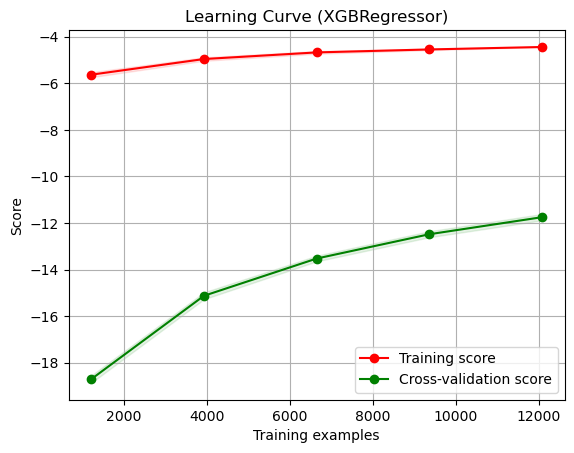

['KAN_L' 'KPC_L' 'MIT' 'NUK_L' 'NUK_U' 'QAS_L' 'QAS_U' 'SCO_L' 'SCO_U'
 'TAS_L' 'THU_L' 'UPE_L' 'UPE_U']
------------------------------------------------------------------------------------
station_names KAN_L
Number of observations at station 552
R^2 score on test set:  0.9336366696536748
MSE on test set:  10.085362500512208
MAE on test set 7.2409994865673175


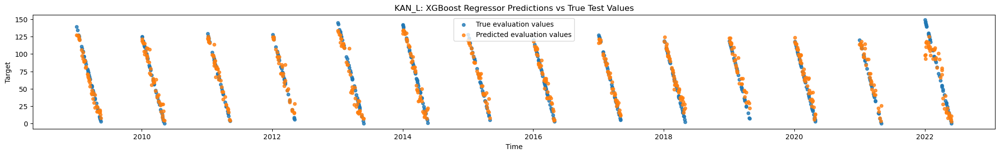

------------------------------------------------------------------------------------
station_names KPC_L
Number of observations at station 509
R^2 score on test set:  0.9631603836106528
MSE on test set:  9.536725288844355
MAE on test set 7.008807660554387


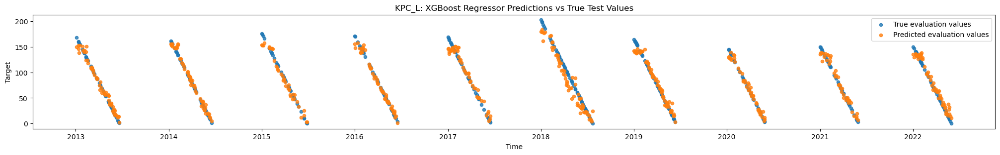

------------------------------------------------------------------------------------
station_names MIT
Number of observations at station 734
R^2 score on test set:  0.8713050943347849
MSE on test set:  21.774587453718166
MAE on test set 15.946460727774804


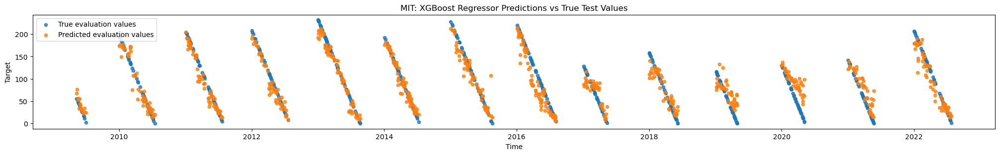

------------------------------------------------------------------------------------
station_names NUK_L
Number of observations at station 599
R^2 score on test set:  0.7990431022704351
MSE on test set:  18.932390494584865
MAE on test set 13.681744882777856


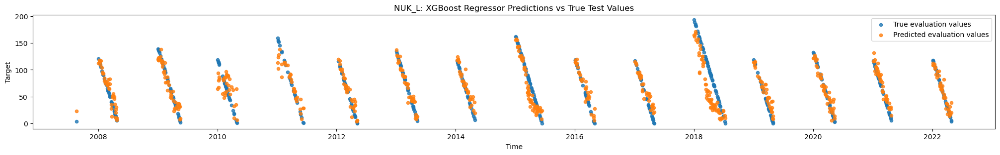

------------------------------------------------------------------------------------
station_names NUK_U
Number of observations at station 579
R^2 score on test set:  0.8576809729763317
MSE on test set:  21.045668605537294
MAE on test set 15.608146245409582


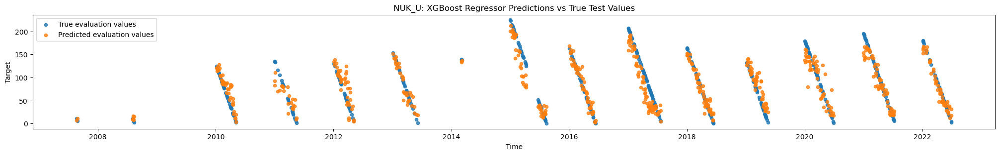

------------------------------------------------------------------------------------
station_names QAS_L
Number of observations at station 640
R^2 score on test set:  0.8751859165848366
MSE on test set:  15.543348955957168
MAE on test set 12.210805312544107


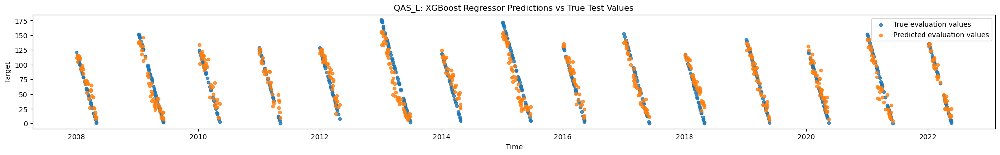

------------------------------------------------------------------------------------
station_names QAS_U
Number of observations at station 750
R^2 score on test set:  0.9208765939945077
MSE on test set:  17.750942230157513
MAE on test set 12.926028205871582


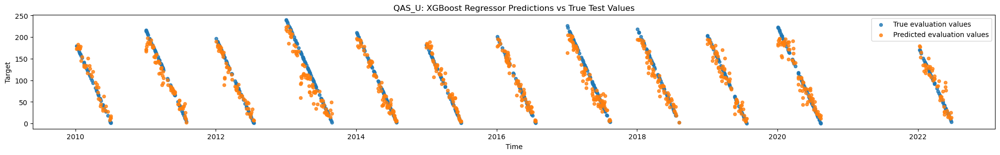

------------------------------------------------------------------------------------
station_names SCO_L
Number of observations at station 610
R^2 score on test set:  0.9674497072438386
MSE on test set:  7.893757758368095
MAE on test set 5.794115724719939


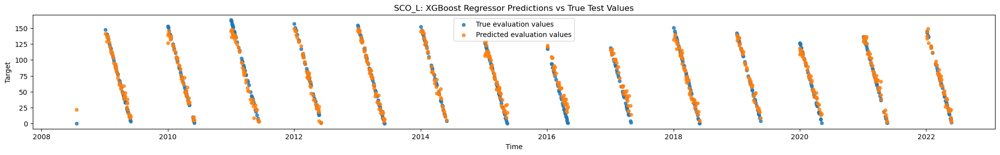

------------------------------------------------------------------------------------
station_names SCO_U
Number of observations at station 582
R^2 score on test set:  0.9309714427006621
MSE on test set:  12.177830404526436
MAE on test set 8.890220699236565


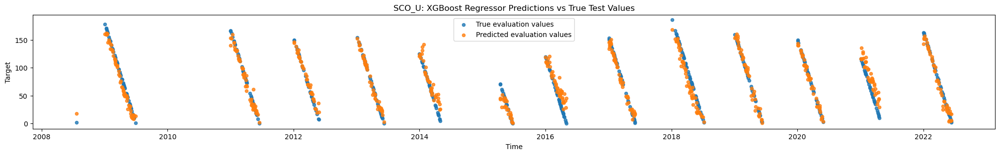

------------------------------------------------------------------------------------
station_names TAS_L
Number of observations at station 267
R^2 score on test set:  0.8166814539300453
MSE on test set:  18.03256780699589
MAE on test set 13.204731477780289


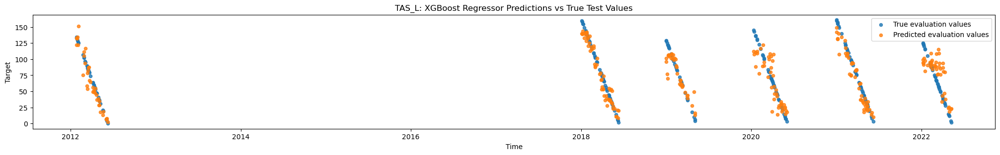

------------------------------------------------------------------------------------
station_names THU_L
Number of observations at station 429
R^2 score on test set:  0.9422187394476577
MSE on test set:  12.271522967638273
MAE on test set 9.307267932625084


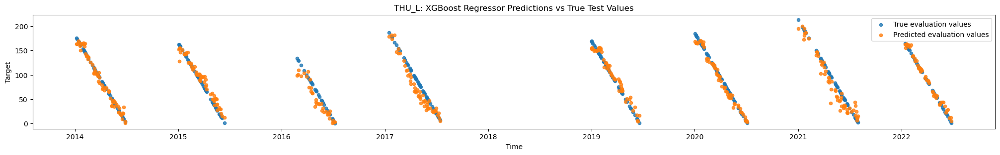

------------------------------------------------------------------------------------
station_names UPE_L
Number of observations at station 477
R^2 score on test set:  0.9336825186544874
MSE on test set:  12.307384337014224
MAE on test set 8.83481882628155


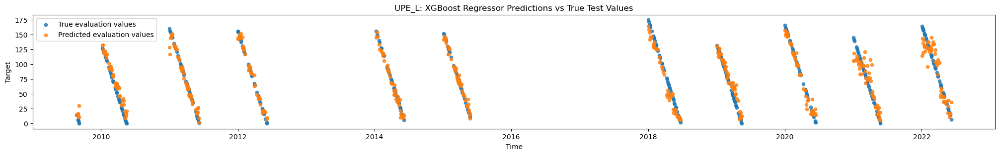

------------------------------------------------------------------------------------
station_names UPE_U
Number of observations at station 680
R^2 score on test set:  0.9078622068077329
MSE on test set:  15.912034133702086
MAE on test set 11.341382516482296


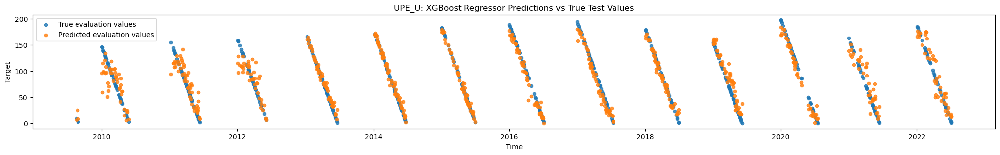

<module 'matplotlib.pyplot' from 'c:\\Users\\mabj16ac\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [55]:
from sklearn.metrics import make_scorer, mean_absolute_error
from sklearn.model_selection import GridSearchCV, ShuffleSplit

cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=123)
#tscv = TimeSeriesSplit(n_splits=5)

df, features, target = preprocessing_melt(data, start_end='start',lags=False, exclude_nan=False)
X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, method='standard_train_test')
X_train.drop('year_encoded', axis=1, inplace=True)
X_test.drop('year_encoded', axis=1, inplace=True)

y_train = y_train['time_to_event']
y_test = y_test['time_to_event']

# XGB Regressor
model = xgb.XGBRegressor()

# Define the hyperparameter grid for tuning
param_grid ={
    'learning_rate': [0.005, 0.01, 0.05, 0.1, 0.2],
    'max_depth': [5, 7, 9, 11, 13, 15],
    'min_child_weight': [1, 2, 4, 6, 8, 10], 
    'gamma': [0, 0.1, 0.5, 0.7, 1], 
    'subsample': [0.5, 0.7, 0.8, 0.9, 1], 
    'colsample_bytree': [0.5, 0.7, 0.8, 0.9, 1]
}
 

param_grid ={
    'learning_rate': [0.005, 0.01, 0.1],
    'max_depth': [3, 5, 9,  15],
    'min_child_weight': [1, 5, 10], 
    'gamma': [0, 0.1, 0.5, 1], 
    'subsample': [0.5, 0.7, 1], 
    'colsample_bytree': [0.5, 0.7, 1]
}

#Old params 

param_grid = {
 'colsample_bytree': [0.9], 'gamma': [0], 'learning_rate': [0.05], 'max_depth': [15], 'min_child_weight': [10], 'subsample': [0.8]
 }

param_grid2 = {
'colsample_bytree': [1], 'gamma': [0.5], 'learning_rate': [0.1], 'max_depth': [15], 'min_child_weight': [5], 'subsample': [1]}


# Define the grid search object
grid_search = GridSearchCV(model, param_grid = param_grid, cv=cv,  n_jobs=-1, verbose=5, scoring=make_scorer(mean_absolute_error, greater_is_better=False))

# Fit the grid search object to the training data
grid_search.fit(X_train, y_train)
print(grid_search.best_params_)
# Print the best hyperparameters and the corresponding R^2 score on the test set

print(f"Best hyperparameters: ", grid_search.best_params_)
print('------------------------------------------------------------------------------------')
# Save the best model parameters as 'model' variable
xgb_model = grid_search.best_estimator_

# Evaluate the best model on the test set
y_pred = xgb_model.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred) 

print("Average MAE test score from cv :", grid_search.cv_results_["mean_test_score"][0])
print("Standard deviation of MAE test scores from cv:", grid_search.cv_results_["std_test_score"][0])

mean_test_score = grid_search.cv_results_["mean_test_score"][0]
std_test_score = grid_search.cv_results_["std_test_score"][0]

best_estimator = grid_search.best_estimator_

print('------------------------------------------------------------------------------------')
print(f'MAE on validation set: ', mae)
print(f"R^2 score on validation set: ", r2)
#print(f"MSE on validation set: ", mse)


plot_learning_curve(best_estimator, "Learning Curve (XGBRegressor)", X_train, y_train, cv=cv)


station_performance_viz(df, X_train, X_test, y_train, y_test, 'XGBoost Regressor', xgb_model)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
Best hyperparameters:  {'fit_intercept': False}
------------------------------------------------------------------------------------
Average R^2 test score from cv : -17.874911449681186
Standard deviation of R^2 test scores from cv: 0.24004778492894988
------------------------------------------------------------------------------------
R^2 score on validation set:  0.5350031319306194
MSE on validation set:  24.06341568902359
MAE on validation set:  17.986909223693296


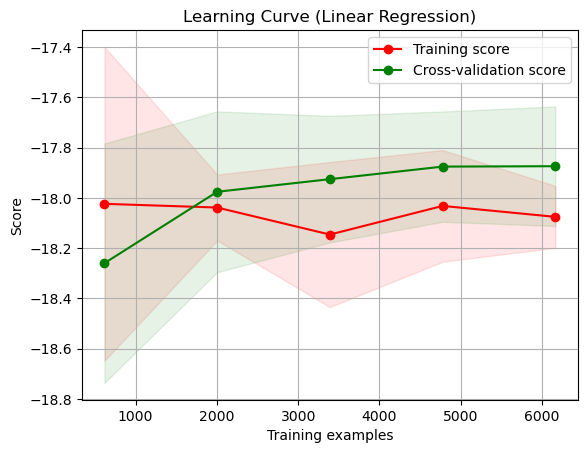

['KAN_L' 'KPC_L' 'MIT' 'NUK_L' 'NUK_U' 'QAS_L' 'QAS_U' 'SCO_L' 'SCO_U'
 'TAS_L' 'THU_L' 'UPE_L' 'UPE_U']
------------------------------------------------------------------------------------
station_names KAN_L
Number of observations at station 543
R^2 score on test set:  0.5755522862846327
MSE on test set:  25.4304774796076
MAE on test set 19.47637990100347


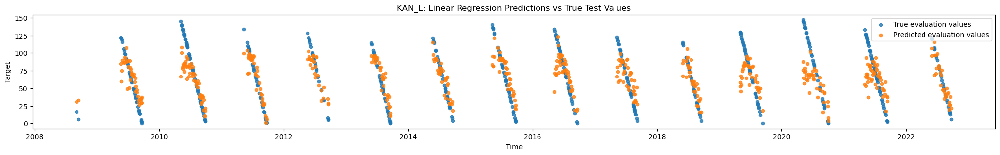

------------------------------------------------------------------------------------
station_names KPC_L
Number of observations at station 254
R^2 score on test set:  0.06254894563270275
MSE on test set:  25.771071446716206
MAE on test set 22.510302928214692


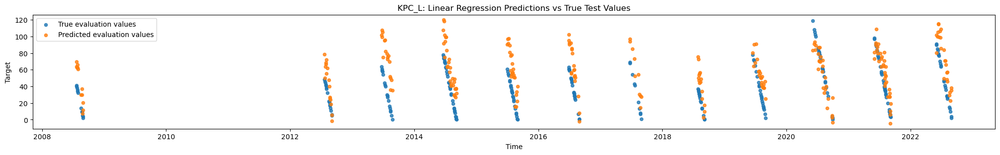

------------------------------------------------------------------------------------
station_names MIT
Number of observations at station 186
R^2 score on test set:  -0.27509792593206295
MSE on test set:  32.65162409669109
MAE on test set 22.786831197629727


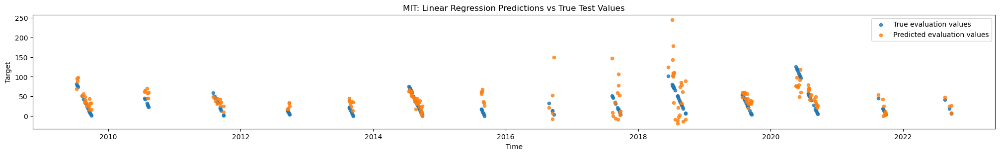

------------------------------------------------------------------------------------
station_names NUK_L
Number of observations at station 462
R^2 score on test set:  0.4396468037605772
MSE on test set:  30.988233707362397
MAE on test set 22.820235150371666


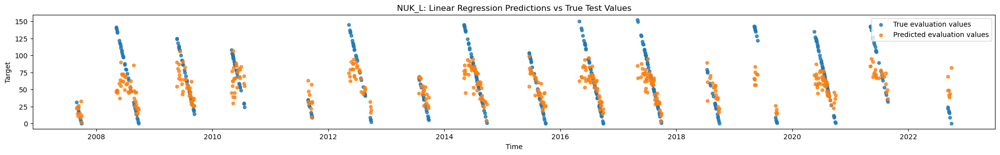

------------------------------------------------------------------------------------
station_names NUK_U
Number of observations at station 235
R^2 score on test set:  0.34763031574481906
MSE on test set:  26.118728108014906
MAE on test set 20.451270316286166


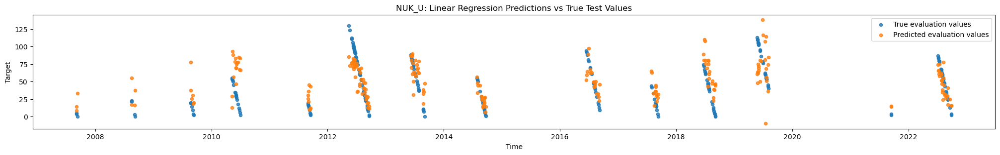

------------------------------------------------------------------------------------
station_names QAS_L
Number of observations at station 366
R^2 score on test set:  0.5332909907533774
MSE on test set:  25.669734008483843
MAE on test set 19.55918607061188


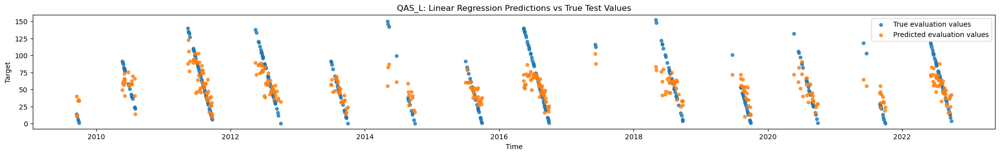

------------------------------------------------------------------------------------
station_names QAS_U
Number of observations at station 153
R^2 score on test set:  -0.04510685197790165
MSE on test set:  18.248033150285142
MAE on test set 14.12943997710418


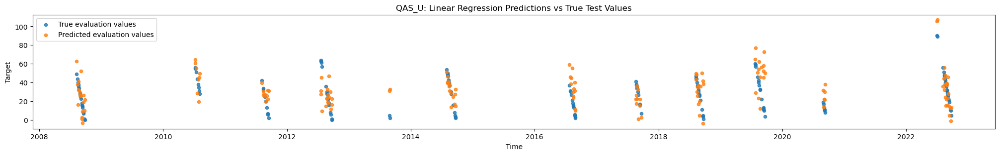

------------------------------------------------------------------------------------
station_names SCO_L
Number of observations at station 397
R^2 score on test set:  0.6955663772070806
MSE on test set:  18.61435333340296
MAE on test set 13.360957067570707


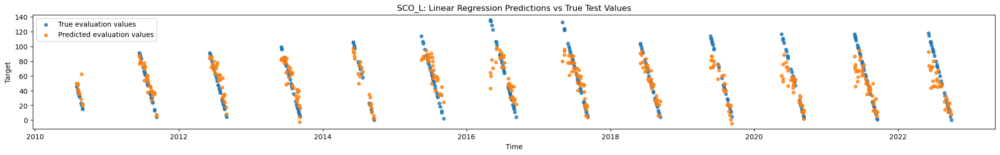

------------------------------------------------------------------------------------
station_names SCO_U
Number of observations at station 366
R^2 score on test set:  0.6814681656695882
MSE on test set:  16.614498701744786
MAE on test set 12.088457137057578


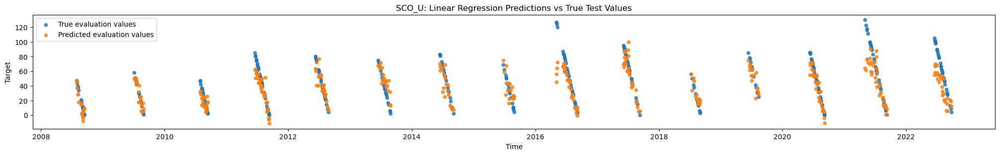

------------------------------------------------------------------------------------
station_names TAS_L
Number of observations at station 157
R^2 score on test set:  0.5847562756056826
MSE on test set:  21.269219795835706
MAE on test set 16.4005972804541


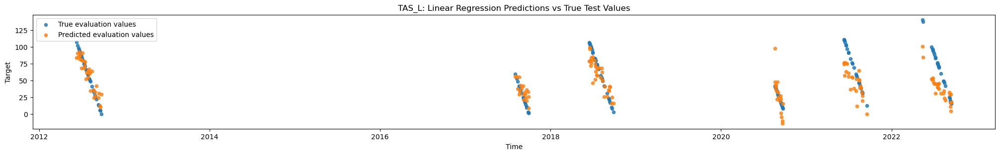

------------------------------------------------------------------------------------
station_names THU_L
Number of observations at station 171
R^2 score on test set:  0.6405279026883439
MSE on test set:  14.143750390064069
MAE on test set 11.069637189757056


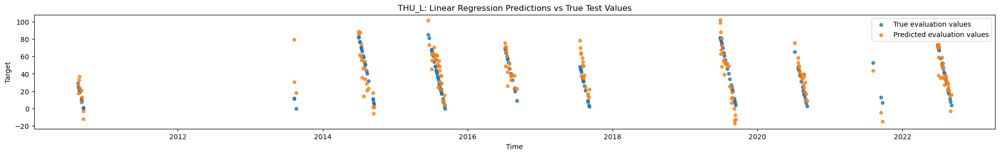

------------------------------------------------------------------------------------
station_names UPE_L
Number of observations at station 321
R^2 score on test set:  0.5545524464471635
MSE on test set:  20.129246977939687
MAE on test set 16.67910783596283


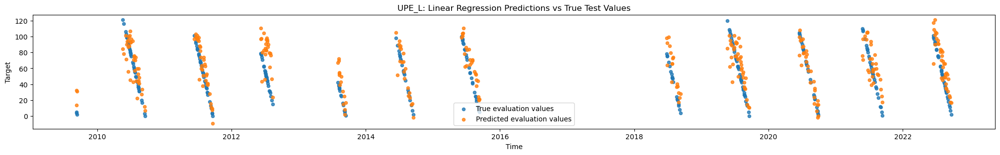

------------------------------------------------------------------------------------
station_names UPE_U
Number of observations at station 170
R^2 score on test set:  0.15772994182707634
MSE on test set:  24.405999905726684
MAE on test set 19.15839849447942


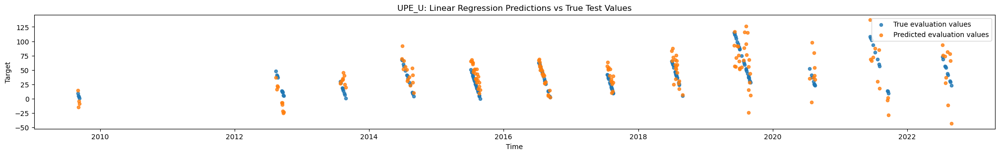

<module 'matplotlib.pyplot' from 'c:\\Users\\mabj16ac\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [24]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV, ShuffleSplit
from sklearn.metrics import mean_absolute_error

cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=123)
df, features, target = preprocessing_melt(data, start_end='end', lags=False, exclude_nan=True)
X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, method='standard_train_test')
X_train.drop('year_encoded', axis=1, inplace=True)
X_test.drop('year_encoded', axis=1, inplace=True)
y_train = y_train['time_to_event']
y_test = y_test['time_to_event']

# Linear Regression
model = LinearRegression()

# Define the hyperparameter grid for tuning
param_grid = {
    'fit_intercept': [True, False]
}

# Define the grid search object with 'neg_mean_absolute_error' as the scoring metric
grid_search = GridSearchCV(model, param_grid=param_grid, cv=cv, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=5)

# Fit the grid search object to the training data
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding negative mean absolute error score on the test set
print(f"Best hyperparameters: ", grid_search.best_params_)
print('------------------------------------------------------------------------------------')
lr_model = grid_search.best_estimator_

# Evaluate the best model on the test set
y_pred = lr_model.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)

print("Average R^2 test score from cv :", grid_search.cv_results_["mean_test_score"][0])
print("Standard deviation of R^2 test scores from cv:", grid_search.cv_results_["std_test_score"][0])

mean_test_score = grid_search.cv_results_["mean_test_score"][0]
std_test_score = grid_search.cv_results_["std_test_score"][0]

best_estimator = grid_search.best_estimator_

print('------------------------------------------------------------------------------------')
print(f"R^2 score on validation set: ", r2)
print(f"MSE on validation set: ", mse)
print(f'MAE on validation set: ', mae)

plot_learning_curve(best_estimator, "Learning Curve (Linear Regression)", X_train, y_train, cv=cv)


station_performance_viz(df, X_train, X_test, y_train, y_test, 'Linear Regression', lr_model)



Fitting 5 folds for each of 60 candidates, totalling 300 fits
Average R^2 test score from cv : -18.263436790310372
Standard deviation of R^2 test scores from cv: 0.2352740650135832
------------------------------------------------------------------------------------
R^2 score on validation set:  0.6589620923502839
MSE on validation set:  20.607892828629804
MAE on validation set:  14.533715520864115


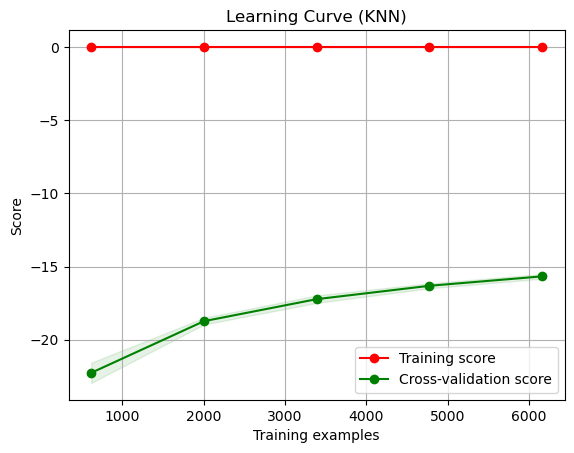

['KAN_L' 'KPC_L' 'MIT' 'NUK_L' 'NUK_U' 'QAS_L' 'QAS_U' 'SCO_L' 'SCO_U'
 'TAS_L' 'THU_L' 'UPE_L' 'UPE_U']
------------------------------------------------------------------------------------
station_names KAN_L
Number of observations at station 543
R^2 score on test set:  0.6353149586005117
MSE on test set:  23.57226908910722
MAE on test set 17.111009789272448


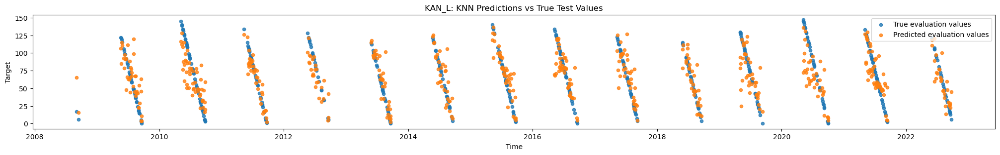

------------------------------------------------------------------------------------
station_names KPC_L
Number of observations at station 254
R^2 score on test set:  0.6625705188495901
MSE on test set:  15.461430980374129
MAE on test set 11.173086380149108


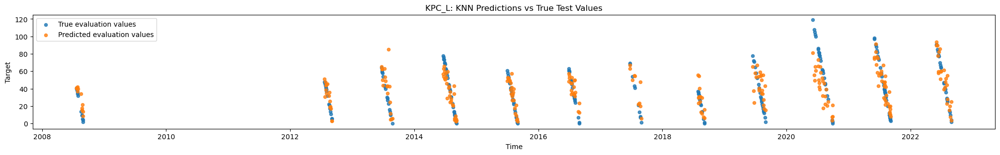

------------------------------------------------------------------------------------
station_names MIT
Number of observations at station 186
R^2 score on test set:  0.5905209053018234
MSE on test set:  18.503287019990836
MAE on test set 13.077676396558502


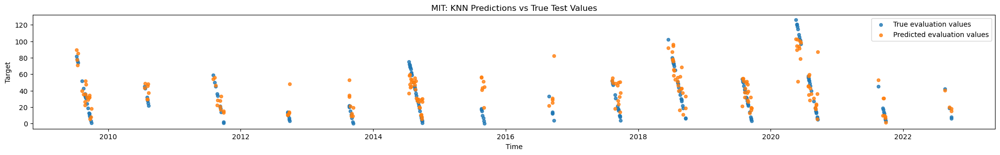

------------------------------------------------------------------------------------
station_names NUK_L
Number of observations at station 462
R^2 score on test set:  0.6132857479129548
MSE on test set:  25.743108369827095
MAE on test set 18.353084439644626


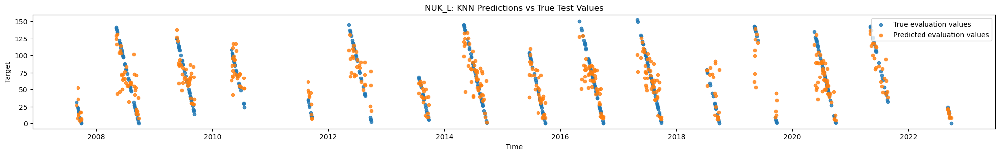

------------------------------------------------------------------------------------
station_names NUK_U
Number of observations at station 235
R^2 score on test set:  0.4446775080601377
MSE on test set:  24.09782081998372
MAE on test set 17.823838835722142


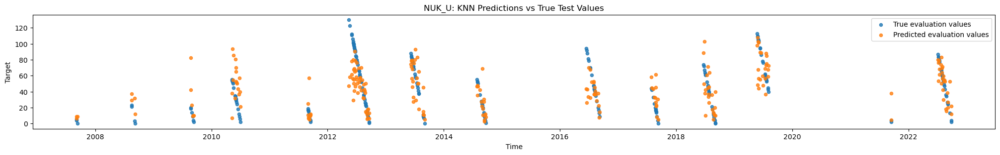

------------------------------------------------------------------------------------
station_names QAS_L
Number of observations at station 366
R^2 score on test set:  0.4975523340857054
MSE on test set:  26.634447531330284
MAE on test set 19.810383609699457


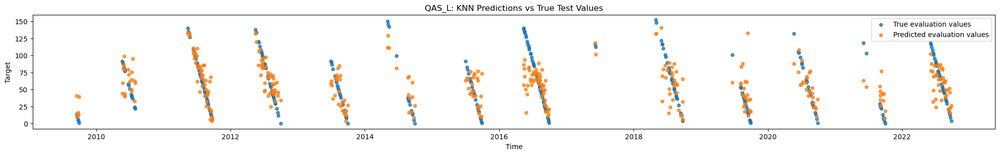

------------------------------------------------------------------------------------
station_names QAS_U
Number of observations at station 153
R^2 score on test set:  0.5696819430357261
MSE on test set:  11.70928829255287
MAE on test set 8.149923428029883


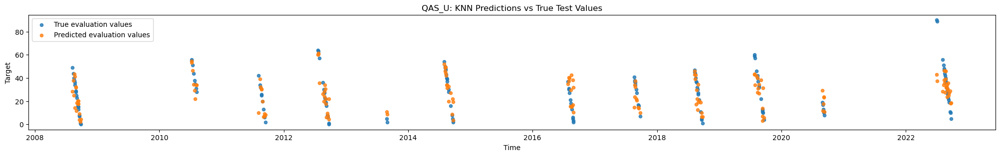

------------------------------------------------------------------------------------
station_names SCO_L
Number of observations at station 397
R^2 score on test set:  0.7156090009743332
MSE on test set:  17.991176693274433
MAE on test set 12.20024471267265


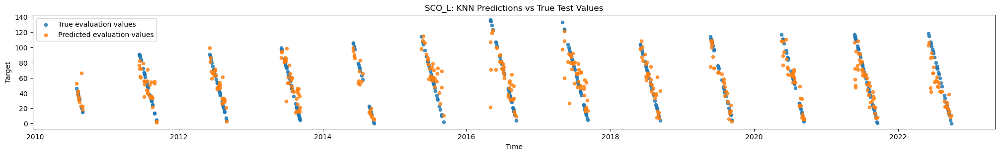

------------------------------------------------------------------------------------
station_names SCO_U
Number of observations at station 366
R^2 score on test set:  0.7266660026819963
MSE on test set:  15.390674282434103
MAE on test set 11.185676745618943


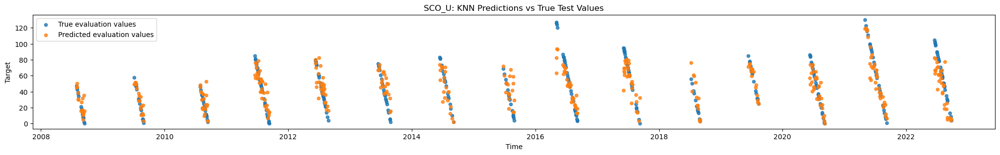

------------------------------------------------------------------------------------
station_names TAS_L
Number of observations at station 157
R^2 score on test set:  0.6034086256902568
MSE on test set:  20.78603492078986
MAE on test set 16.37630826496357


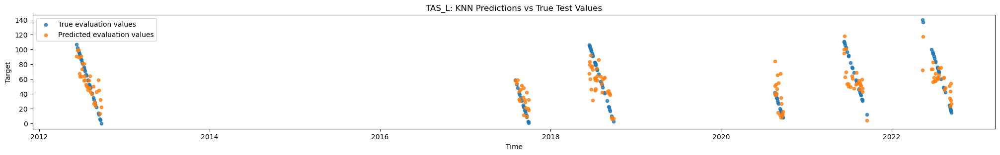

------------------------------------------------------------------------------------
station_names THU_L
Number of observations at station 171
R^2 score on test set:  0.6542013500980344
MSE on test set:  13.872145559418207
MAE on test set 10.163947662588615


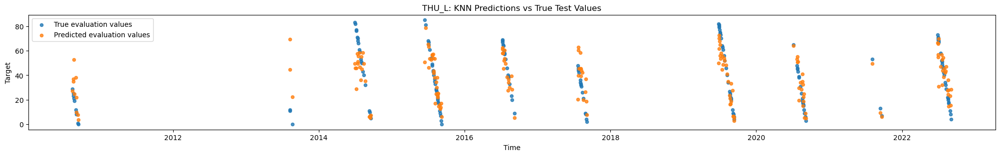

------------------------------------------------------------------------------------
station_names UPE_L
Number of observations at station 321
R^2 score on test set:  0.6742928135826696
MSE on test set:  17.212458650366308
MAE on test set 12.516614604141699


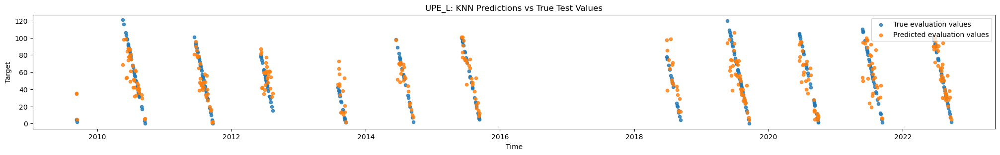

------------------------------------------------------------------------------------
station_names UPE_U
Number of observations at station 170
R^2 score on test set:  0.6230125287148752
MSE on test set:  16.3280522980056
MAE on test set 11.533052468743815


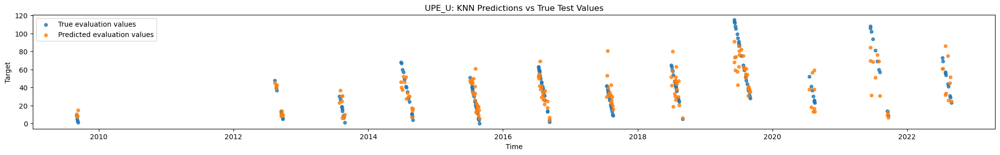

<module 'matplotlib.pyplot' from 'c:\\Users\\mabj16ac\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [25]:
from sklearn.neighbors import KNeighborsRegressor
df, features, target = preprocessing_melt(data, start_end='end',lags=False, exclude_nan=True)
X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, method='standard_train_test')
X_train.drop('year_encoded', axis=1, inplace=True)
X_test.drop('year_encoded', axis=1, inplace=True)
y_train = y_train['time_to_event']
y_test = y_test['time_to_event']

# Create the k-Nearest Neighbors Regressor
knn_model = KNeighborsRegressor()

# Define hyperparameter search space
param_grid = {
    'n_neighbors': range(1, 11),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

# Create grid search object
grid_search = GridSearchCV(knn_model, param_grid, cv=cv, n_jobs=-1, verbose = 2, scoring='neg_mean_absolute_error')

# Fit the grid search object to the training data
grid_search.fit(X_train, y_train)

knn_model = grid_search.best_estimator_

# Evaluate the best model on the test set
y_pred = knn_model.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)

print("Average R^2 test score from cv :", grid_search.cv_results_["mean_test_score"][0])
print("Standard deviation of R^2 test scores from cv:", grid_search.cv_results_["std_test_score"][0])

mean_test_score = grid_search.cv_results_["mean_test_score"][0]
std_test_score = grid_search.cv_results_["std_test_score"][0]

best_estimator = grid_search.best_estimator_

print('------------------------------------------------------------------------------------')
print(f"R^2 score on validation set: ", r2)
print(f"MSE on validation set: ", mse)
print(f'MAE on validation set: ', mae)

plot_learning_curve(best_estimator, "Learning Curve (KNN)", X_train, y_train, cv=cv)

station_performance_viz(df, X_train, X_test, y_train, y_test, 'KNN', knn_model)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Average R^2 test score from cv : -12.886910316747654
Standard deviation of R^2 test scores from cv: 0.1882267609871958
------------------------------------------------------------------------------------
R^2 score on validation set:  0.7543131228233201
MSE on validation set:  17.704407338487094
MAE on validation set:  12.35829369924612


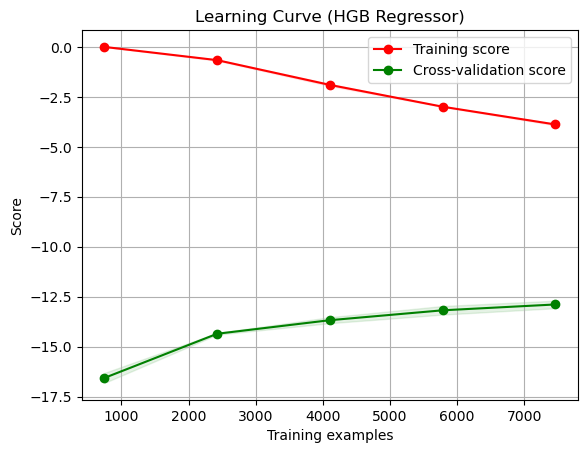

['KAN_L' 'KPC_L' 'MIT' 'NUK_L' 'NUK_U' 'QAS_L' 'QAS_U' 'SCO_L' 'SCO_U'
 'TAS_L' 'THU_L' 'UPE_L' 'UPE_U']
------------------------------------------------------------------------------------
station_names KAN_L
Number of observations at station 544
R^2 score on test set:  0.7454439808655466
MSE on test set:  19.34416764045575
MAE on test set 13.492980608736532


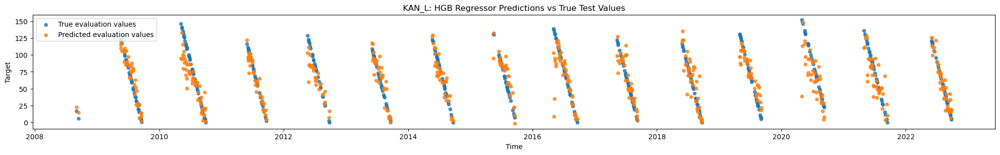

------------------------------------------------------------------------------------
station_names KPC_L
Number of observations at station 254
R^2 score on test set:  0.7885667131044246
MSE on test set:  12.299281297714447
MAE on test set 9.169038226293008


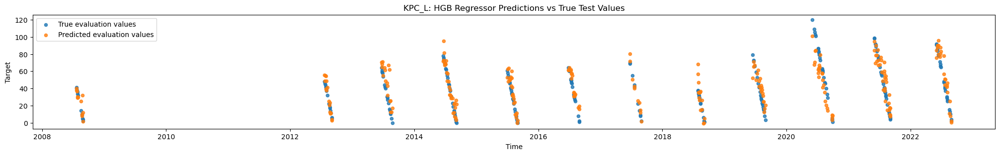

------------------------------------------------------------------------------------
station_names MIT
Number of observations at station 302
R^2 score on test set:  0.7651363458356837
MSE on test set:  17.68435528508717
MAE on test set 12.374670866290986


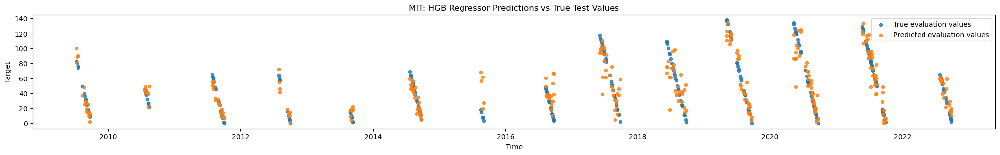

------------------------------------------------------------------------------------
station_names NUK_L
Number of observations at station 589
R^2 score on test set:  0.6884853357286546
MSE on test set:  22.736461999376917
MAE on test set 15.298218774804978


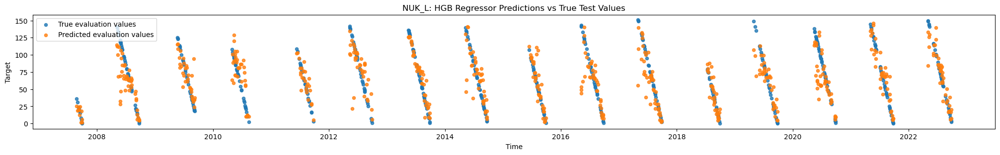

------------------------------------------------------------------------------------
station_names NUK_U
Number of observations at station 314
R^2 score on test set:  0.5659463284695554
MSE on test set:  19.584709915187894
MAE on test set 14.524870864888767


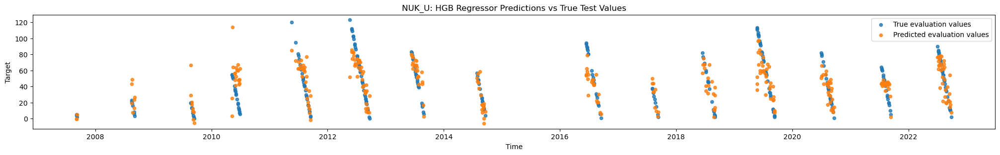

------------------------------------------------------------------------------------
station_names QAS_L
Number of observations at station 532
R^2 score on test set:  0.7208096114260241
MSE on test set:  21.151391357501474
MAE on test set 15.486126739330606


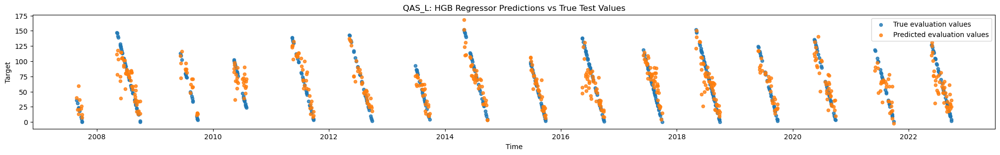

------------------------------------------------------------------------------------
station_names QAS_U
Number of observations at station 173
R^2 score on test set:  0.5375498538126872
MSE on test set:  11.44293697381112
MAE on test set 8.55826925398451


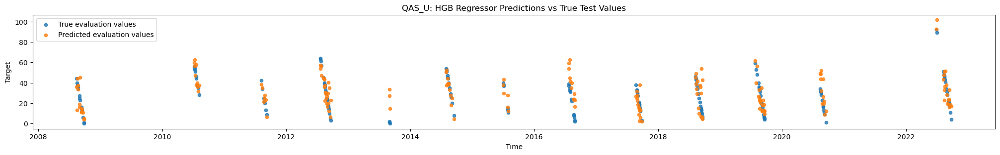

------------------------------------------------------------------------------------
station_names SCO_L
Number of observations at station 463
R^2 score on test set:  0.8527743757031141
MSE on test set:  13.184682365787772
MAE on test set 9.511978652519156


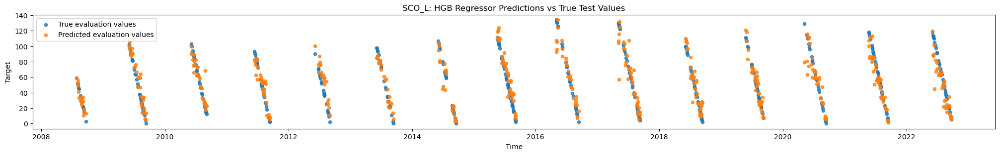

------------------------------------------------------------------------------------
station_names SCO_U
Number of observations at station 368
R^2 score on test set:  0.792717415051027
MSE on test set:  13.428181371173023
MAE on test set 9.865539860853385


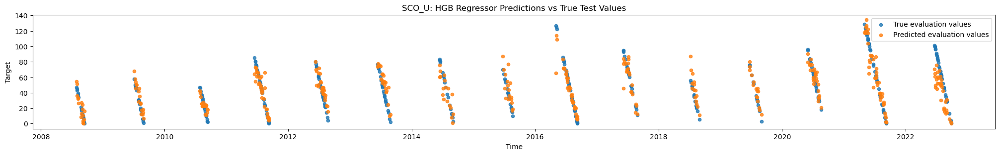

------------------------------------------------------------------------------------
station_names TAS_L
Number of observations at station 243
R^2 score on test set:  0.7327420510762361
MSE on test set:  18.144428353195618
MAE on test set 12.023382998655887


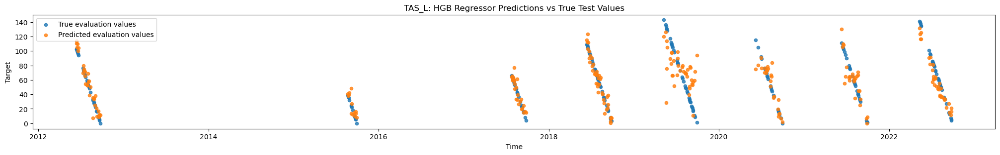

------------------------------------------------------------------------------------
station_names THU_L
Number of observations at station 179
R^2 score on test set:  0.6864571298878468
MSE on test set:  12.79440876014538
MAE on test set 9.02220271874778


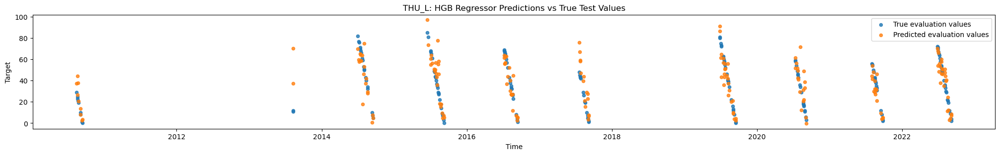

------------------------------------------------------------------------------------
station_names UPE_L
Number of observations at station 321
R^2 score on test set:  0.7805416999265097
MSE on test set:  14.128798938299811
MAE on test set 10.298640238017784


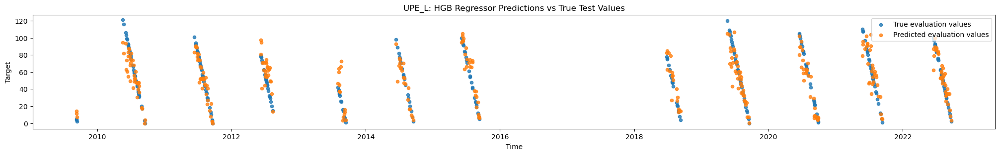

------------------------------------------------------------------------------------
station_names UPE_U
Number of observations at station 295
R^2 score on test set:  0.5968923452216555
MSE on test set:  17.698699769367312
MAE on test set 13.525076360531362


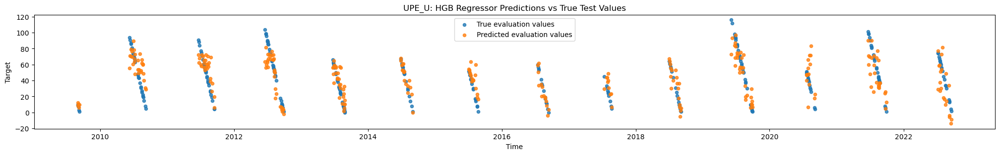

<module 'matplotlib.pyplot' from 'c:\\Users\\mabj16ac\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [20]:
from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor

cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=123)
df, features, target = preprocessing_melt(data, start_end='end',lags=False, exclude_nan=False)
X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, method='standard_train_test')
X_train.drop('year_encoded', axis=1, inplace=True)
X_test.drop('year_encoded', axis=1, inplace=True)
y_train = y_train['time_to_event']
y_test = y_test['time_to_event']


# This bit to find best HistGradientBoostingRegressor model for when Ablation == True and for both target variables
model = HistGradientBoostingRegressor()

param_grid = {
    'min_samples_leaf': [5],#[1, 3, 5],
    'learning_rate': [0.1],#[0.1, 0.01, 0.001],
    'max_iter': [500],#[100, 500, 1000],
    'l2_regularization': [0.1],#[0, 0.1, 0.5]
}

param_grid2 = {
    'min_samples_leaf': [1, 3, 5],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_iter': [100, 500, 1000],
    'l2_regularization': [0, 0.1, 0.5]
}

# Define the grid search object
grid_search = GridSearchCV(model, param_grid = param_grid, cv=cv, n_jobs=-1, verbose=5, scoring='neg_mean_absolute_error')

# Fit the grid search object to the training data
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding R^2 score on the test set

# Save the best model parameters as 'model' variable
hist_model = grid_search.best_estimator_

# Evaluate the best model on the test set
y_pred = hist_model.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)

print("Average R^2 test score from cv :", grid_search.cv_results_["mean_test_score"][0])
print("Standard deviation of R^2 test scores from cv:", grid_search.cv_results_["std_test_score"][0])

mean_test_score = grid_search.cv_results_["mean_test_score"][0]
std_test_score = grid_search.cv_results_["std_test_score"][0]

best_estimator = grid_search.best_estimator_

print('------------------------------------------------------------------------------------')
print(f"R^2 score on validation set: ", r2)
print(f"MSE on validation set: ", mse)
print(f'MAE on validation set: ', mae)

plot_learning_curve(best_estimator, "Learning Curve (HGB Regressor)", X_train, y_train, cv=cv)

station_performance_viz(df, X_train, X_test, y_train, y_test, 'HGB Regressor', hist_model)

In [42]:
period = 'end'

df, features, target = preprocessing_melt(data, start_end=period,lags=False, exclude_nan=False)
#features['DayOfYear'] = df['DayOfYear']
X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, method='standard_train_test')

X_train.drop('year_encoded', inplace=True, axis=1)
X_test.drop('year_encoded', inplace=True, axis = 1)
y_train = y_train['time_to_event']
y_test = y_test['time_to_event']

model = xgb.XGBRegressor()
param_grid = {'colsample_bytree': [0.9], 'gamma': [0], 'learning_rate': [0.05], 'max_depth': [15], 'min_child_weight': [10], 'subsample': [0.8]}
grid_search = GridSearchCV(model, param_grid = param_grid, cv=cv,  n_jobs=-1, verbose=5, scoring=make_scorer(mean_absolute_error, greater_is_better=False))
grid_search.fit(X_train, y_train)
xgb_model = grid_search.best_estimator_


def Shap_Filter(df, X_train, period='start'):
    def remove_outliers(lst):
        q1, q3 = np.percentile(lst, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - (1.5 * iqr)
        upper_bound = q3 + (1.5 * iqr)
        return [x for x in lst if lower_bound <= x <= upper_bound]



    max_date, min_date = [], []
    stations = df['stid'].unique()
    for station in stations:
        station_df = df.loc[df['stid'] == station]
        years = station_df['Year'].unique()
        for year in years:
            year_df = station_df.loc[station_df['Year'] == year]
            local_max_date = year_df['DayOfYear'].max()
            local_min_date = year_df['DayOfYear'].min()
            max_date.append(local_max_date)
            min_date.append(local_min_date)

    print('Data Pre Outlier removal')

    print('std max_date:', np.std(max_date))
    print('std min_date:', np.std(min_date))
    max_date_avg = sum(max_date) / len(max_date)
    min_date_avg = sum(min_date) / len(min_date)
    mid_date_avg = (max_date_avg + min_date_avg) / 2 
    print('max date avg:', max_date_avg)
    print('min date avg:', min_date_avg)   


    print('Data Post Outlier removal')
    max_date = remove_outliers(max_date)
    min_date = remove_outliers(min_date)

    max_date_avg = sum(max_date) / len(max_date)
    min_date_avg = sum(min_date) / len(min_date)
    mid_date_avg = (max_date_avg + min_date_avg) / 2 
    print('max date avg:', max_date_avg)
    print('min date avg',min_date_avg)

    print('std max_date:', np.std(max_date))
    print('std min_date:', np.std(min_date))

    start = df.loc[(df['DayOfYear'] >= min_date_avg) & (df['DayOfYear'] < min_date_avg + 7)].index
    print('first week sample:', df.loc[start]['DayOfYear'].unique())
    middle = df.loc[(df['DayOfYear'] >= mid_date_avg -4 ) & (df['DayOfYear'] < mid_date_avg + 3)].index
    print('middle week sample:', df.loc[middle]['DayOfYear'].unique())
    end = df.loc[(df['DayOfYear'] > max_date_avg -14 ) & (df['DayOfYear'] <= max_date_avg - 7)].index
    print('last week sample:', df.loc[end]['DayOfYear'].unique())

    return start, middle, end


start_idx, mid_idx, end_idx = Shap_Filter(df, X_train, period)
X_train_start, X_test_start = X_train.loc[X_train.index.intersection(start_idx)], X_test.loc[X_test.index.intersection(start_idx)]
X_train_mid, X_test_mid = X_train.loc[X_train.index.intersection(mid_idx)], X_test.loc[X_test.index.intersection(mid_idx)]
X_train_end, X_test_end = X_train.loc[X_train.index.intersection(end_idx)], X_test.loc[X_test.index.intersection(end_idx)]
X_sets = [[X_train_start, X_test_start], [X_train_mid, X_test_mid], [X_train_end, X_test_end]] 
explainer = shap.Explainer(xgb_model)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Data Pre Outlier removal
std max_date: 14.096652742526802
std min_date: 34.79209205295778
max date avg: 259.48295454545456
min date avg: 168.1818181818182
Data Post Outlier removal
max date avg: 260.4161849710983
min date avg 168.1818181818182
std max_date: 12.131751366801963
std min_date: 34.79209205295778
first week sample: [169 170 171 172 173 174 175]
middle week sample: [211 212 213 214 215 216 217]
last week sample: [247 248 249 250 251 252 253]


In [43]:
print(start_idx)

Int64Index([ 57637,  57638,  57639,  57640,  57641,  57642,  57643,  58002,
             58003,  58004,
            ...
            238773, 238774, 238775, 239500, 239501, 239502, 239503, 239504,
            239505, 239506],
           dtype='int64', length=702)


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


[ 2  4 15 11 10  3  9 14  1 12  8 13 16  7  6  0  5]


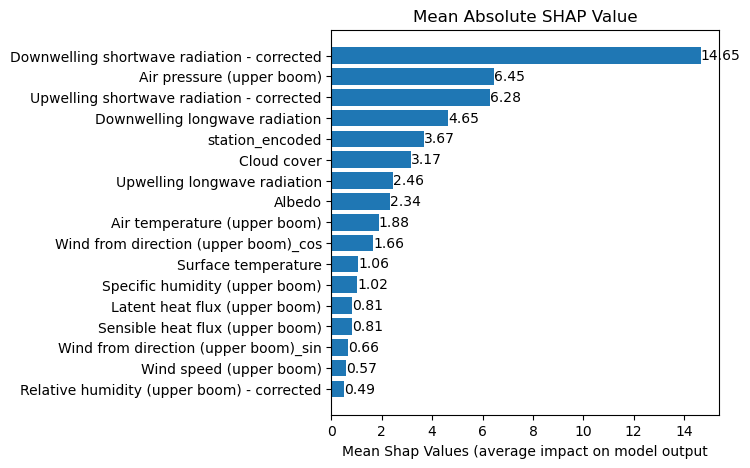

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


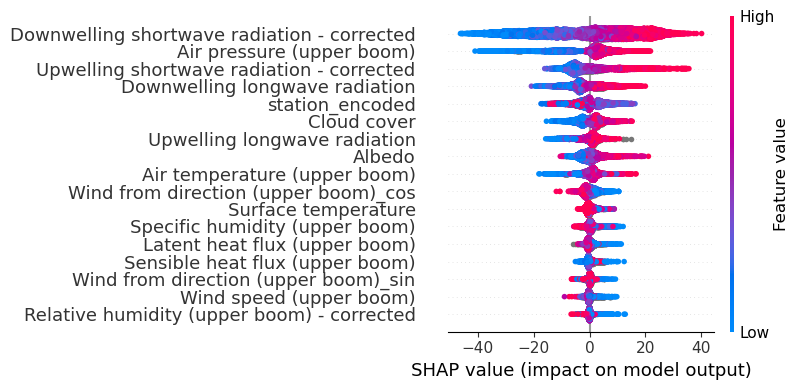

In [44]:
def feature_importance(X_set, shap_values, max_display=None):
    X = X_set

    feature_names = X_set.columns

    mean_abs_shap_values = np.abs(shap_values.values).mean(axis=0)

    # Get the sorted order of the features based on the mean absolute SHAP values
    sorted_feature_indices = np.argsort(mean_abs_shap_values)

    print(sorted_feature_indices)
    if max_display is not None:
        sorted_feature_indices = sorted_feature_indices[-max_display:]
    

    # Get the feature names in sorted order
    sorted_feature_names = feature_names[sorted_feature_indices]
    
    # Create a custom vertical summary plot with feature labels on the left
    plt.figure(figsize=(5, 5))
    bar_plot = plt.barh(sorted_feature_names, mean_abs_shap_values[sorted_feature_indices])
    plt.xlabel("Mean Shap Values (average impact on model output")
    plt.title("Mean Absolute SHAP Value")

    # Add labels to the bars
    for rect in bar_plot:
        width = rect.get_width()
        plt.text(width, rect.get_y() + rect.get_height() / 2.0, "{:.2f}".format(width), ha="left", va="center")

    plt.show()

X_set = pd.concat([X_train, X_test])
X = X_set
shap_values = explainer(X_set)

feature_importance(X_set, shap_values)

shap.summary_plot(shap_values, X, plot_type="dot", plot_size = (8,4))


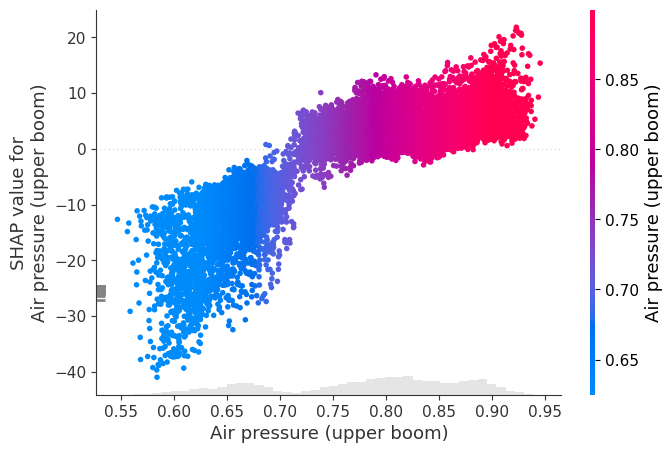

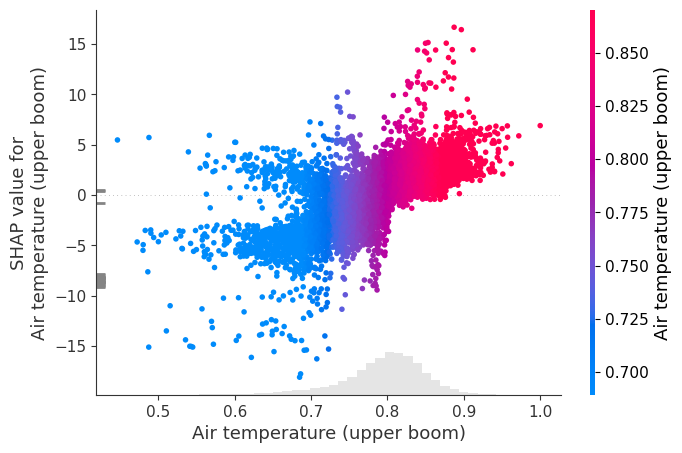

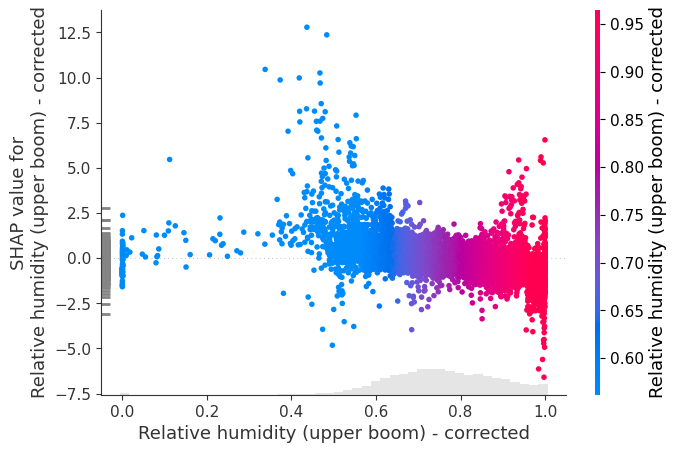

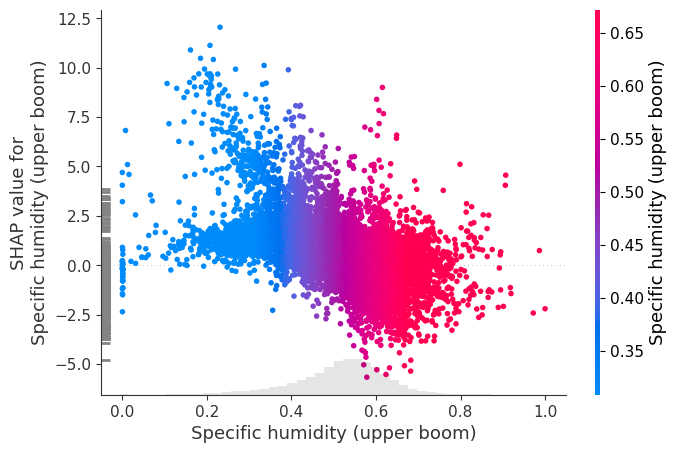

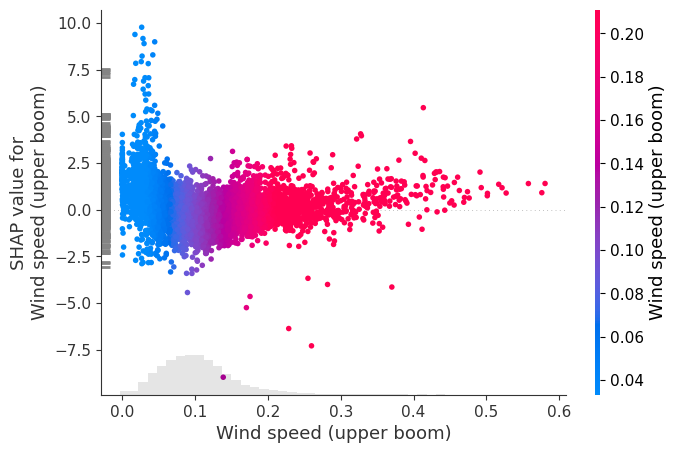

...

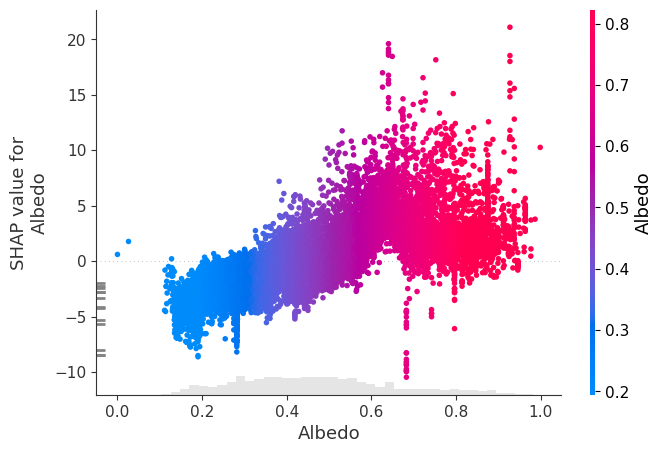

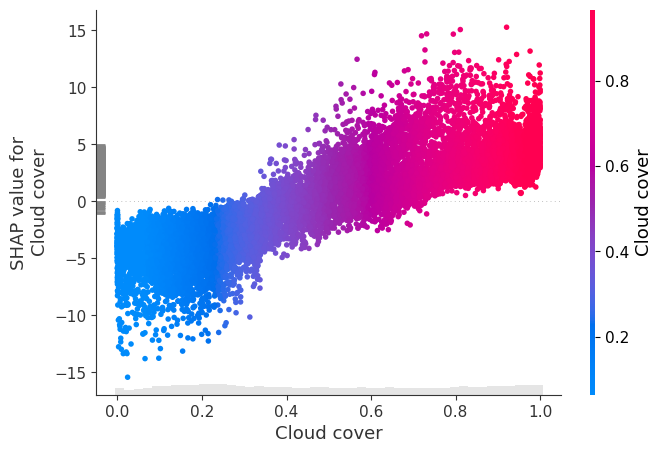

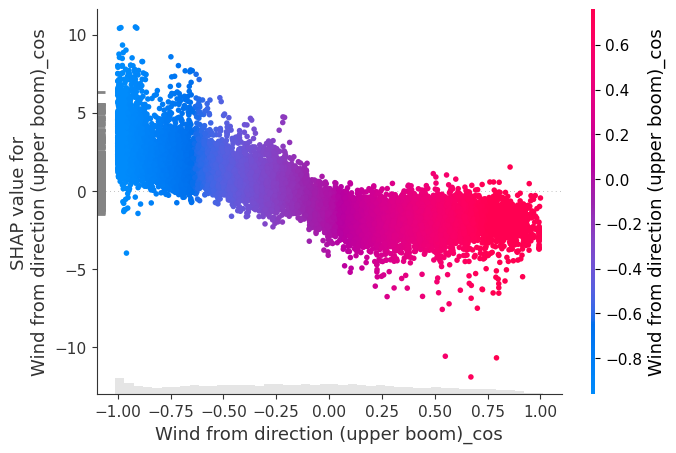

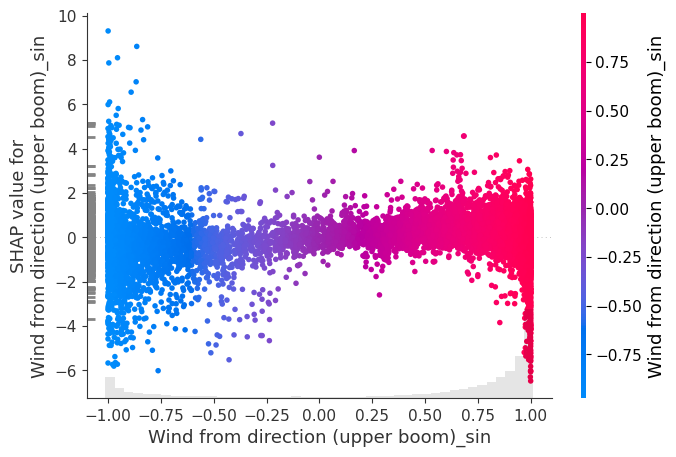

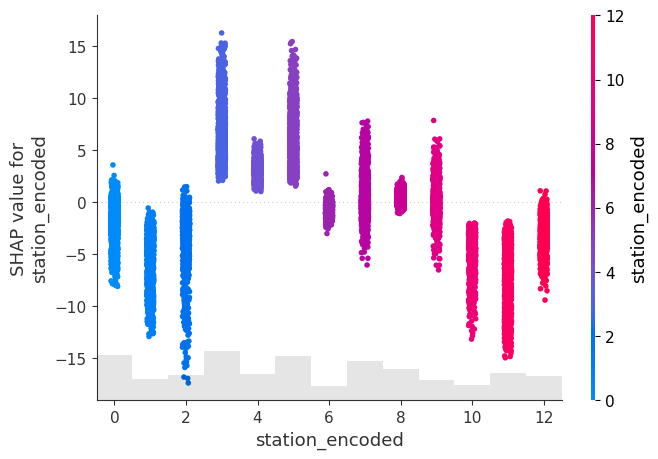

In [45]:
#X_set = pd.concat([X_train, X_test])
#X = X_set
#shap_values = explainer(X_set)

for i in range(17):
    shap.plots.scatter(shap_values[:,i], color=shap_values[:,i])
    

In [46]:
# Group X_test by day of the year

X_set = pd.concat([X_test, X_train])
X_set['time_to_event'] = df['time_to_event']
X_set = X_set.groupby('time_to_event').filter(lambda x: len(x) > 80)
#if period == 'start':
#    X_set = X_set.loc[X_set['time_to_event'] < 160]
#elif period == 'end':
#    X_set = X_set.loc[X_set['time_to_event'] > 160]

grouped = X_set.groupby('time_to_event')

# Initialize an empty array to store average SHAP values for each day of the year
average_shap_values = []

# Filter out groups with less than 50 observations
#grouped = grouped.filter(lambda x: len(x) >= 50)

# Iterate through each day of the year and calculate average SHAP values
for day, group in grouped:
    print(day)
    shap_values_day = explainer(group.drop(columns=['time_to_event']))
    avg_shap_values = np.mean(shap_values_day.values, axis=0)
    average_shap_values.append(avg_shap_values)

# Convert the list of average SHAP values to a NumPy array
average_shap_values = np.array(average_shap_values)


0.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


1.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


2.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


3.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


4.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


5.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


6.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


7.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


8.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


9.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


10.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


11.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


12.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


13.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


14.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


15.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


16.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


17.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


18.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


19.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


20.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


21.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


22.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


23.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


24.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


25.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


26.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


27.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


28.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


29.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


30.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


31.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


32.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


33.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


34.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


35.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


36.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


37.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


38.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


39.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


40.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


41.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


42.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


43.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


44.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


45.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


46.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


47.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


48.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


49.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


50.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


51.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


52.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


53.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


54.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


55.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


56.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


57.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


58.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


59.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


60.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


61.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


62.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


63.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


64.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


65.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


66.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


67.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


68.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


69.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


70.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


71.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


72.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


73.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


74.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


75.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


76.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


77.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


78.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


79.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


80.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


81.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


82.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


83.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


84.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


85.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


86.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


87.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


88.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


89.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


90.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


91.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


92.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


93.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


94.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


95.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


96.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


97.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


98.0


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


,Air pressure (upper boom),Air temperature (upper boom),Relative humidity (upper boom) - corrected,Specific humidity (upper boom),Wind speed (upper boom),Downwelling shortwave radiation - corrected,Upwelling shortwave radiation - corrected,Downwelling longwave radiation,Upwelling longwave radiation,Surface temperature,Latent heat flux (upper boom),Sensible heat flux (upper boom),Albedo,Cloud cover,Wind from direction (upper boom)_cos,Wind from direction (upper boom)_sin,station_encoded
0.0,-3.646821,-3.966992,-0.203678,0.512477,-0.288279,-24.845592,-4.551684,-5.317094,-6.729616,0.994751,-0.245478,-0.261386,0.984329,-0.012836,-0.134651,-0.245250,-0.737799
1.0,-3.588159,-3.696366,-0.216431,0.514369,-0.306001,-23.464645,-4.046674,-5.826289,-6.748044,0.982394,-0.302912,-0.287897,0.888295,-0.293243,-0.062256,-0.140316,-0.704393
2.0,-3.733464,-3.679612,-0.186960,0.603822,-0.251414,-22.956635,-3.891449,-5.692298,-6.155091,0.842162,-0.255137,-0.338988,0.966747,-0.178259,-0.101754,-0.222880,-0.769786
3.0,-3.352222,-3.302592,-0.178740,0.463592,-0.222912,-23.864212,-4.436284,-5.337743,-5.619173,0.811378,-0.328533,-0.317500,0.852252,-0.097886,-0.031233,-0.218051,-0.701203
4.0,-3.295119,-3.096999,-0.069655,0.516363,-0.247087,-22.925344,-3.936662,-5.444393,-5.821656,0.763962,-0.281526,-0.279194,0.915732,-0.186972,-0.129668,-0.184222,-0.669793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94.0,3.357344,1.131942,0.136435,0.434690,0.318628,10.590634,5.071286,2.421375,1.484412,0.477832,0.191522,0.395351,1.778472,2.476375,1.125613,0.522192,1.658985
95.0,3.316862,0.949818,0.181434,0.457455,0.315057,12.630527,6.023853,1.233111,1.523426,0.441317,0.284107,0.428106,2.041217,1.608418,0.461410,0.345881,1.840482
96.0,3.915506,1.144077,0.187073,0.580342,0.319138,13.487447,5.975613,1.345276,1.262230,0.451601,0.260067,0.604145,1.977454,1.723458,1.142019,0.364008,2.293966
97.0,4.519018,0.955929,0.167104,0.526644,0.382743,14.503506,7.067016,1.014626,1.288585,0.501387,0.190100,0.320305,1.867643,1.553319,0.851787,0.349586,2.085135


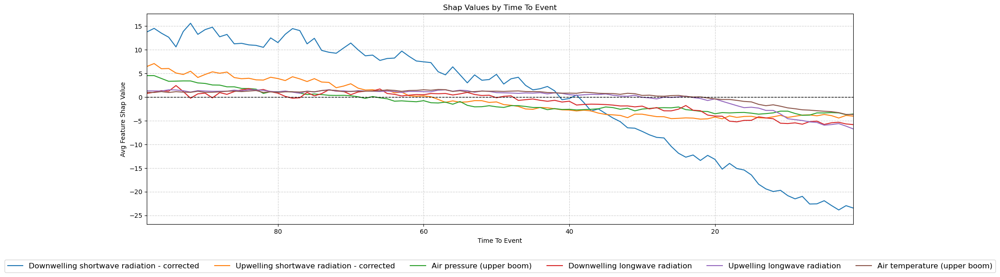

,Air pressure (upper boom),Air temperature (upper boom),Relative humidity (upper boom) - corrected,Specific humidity (upper boom),Wind speed (upper boom),Downwelling shortwave radiation - corrected,Upwelling shortwave radiation - corrected,Downwelling longwave radiation,Upwelling longwave radiation,Surface temperature,Latent heat flux (upper boom),Sensible heat flux (upper boom),Albedo,Cloud cover,Wind from direction (upper boom)_cos,Wind from direction (upper boom)_sin,station_encoded
0.0,-3.646821,-3.966992,-0.203678,0.512477,-0.288279,-24.845592,-4.551684,-5.317094,-6.729616,0.994751,-0.245478,-0.261386,0.984329,-0.012836,-0.134651,-0.245250,-0.737799
1.0,-3.588159,-3.696366,-0.216431,0.514369,-0.306001,-23.464645,-4.046674,-5.826289,-6.748044,0.982394,-0.302912,-0.287897,0.888295,-0.293243,-0.062256,-0.140316,-0.704393
2.0,-3.733464,-3.679612,-0.186960,0.603822,-0.251414,-22.956635,-3.891449,-5.692298,-6.155091,0.842162,-0.255137,-0.338988,0.966747,-0.178259,-0.101754,-0.222880,-0.769786
3.0,-3.352222,-3.302592,-0.178740,0.463592,-0.222912,-23.864212,-4.436284,-5.337743,-5.619173,0.811378,-0.328533,-0.317500,0.852252,-0.097886,-0.031233,-0.218051,-0.701203
4.0,-3.295119,-3.096999,-0.069655,0.516363,-0.247087,-22.925344,-3.936662,-5.444393,-5.821656,0.763962,-0.281526,-0.279194,0.915732,-0.186972,-0.129668,-0.184222,-0.669793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94.0,3.357344,1.131942,0.136435,0.434690,0.318628,10.590634,5.071286,2.421375,1.484412,0.477832,0.191522,0.395351,1.778472,2.476375,1.125613,0.522192,1.658985
95.0,3.316862,0.949818,0.181434,0.457455,0.315057,12.630527,6.023853,1.233111,1.523426,0.441317,0.284107,0.428106,2.041217,1.608418,0.461410,0.345881,1.840482
96.0,3.915506,1.144077,0.187073,0.580342,0.319138,13.487447,5.975613,1.345276,1.262230,0.451601,0.260067,0.604145,1.977454,1.723458,1.142019,0.364008,2.293966
97.0,4.519018,0.955929,0.167104,0.526644,0.382743,14.503506,7.067016,1.014626,1.288585,0.501387,0.190100,0.320305,1.867643,1.553319,0.851787,0.349586,2.085135


In [48]:

days = grouped.mean().index.unique().to_list()

features_names = X_train.columns.to_list()

shap_df = pd.DataFrame(average_shap_values, columns=X_train.columns, index=days)
display(shap_df)


# Find the six columns with the highest average values
abs_df = shap_df.abs()
top_six_columns = abs_df.mean().nlargest(6).index

# Plot the DataFrame as a line plot with the index as the x-axis, and only the six columns with the highest average values
ax = shap_df[top_six_columns].plot(kind='line', figsize=(20, 6))
ax.axhline(y=0, color='black', linestyle='--', linewidth=1)
plt.xlabel('Time To Event')
plt.ylabel('Avg Feature Shap Value')
plt.title('Shap Values by Time To Event')

ax.set_xlim(1, days[-1])
plt.gca().invert_xaxis()
ax.grid(True, linestyle='--', alpha=0.6)

# Move the legend underneath the plot
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=6, fontsize=12)



# Display the plot
plt.show()

display(shap_df)


In [49]:
display(df.columns)
display(df)

Index(['stid', 'Datetime', 'Air pressure (upper boom)',
       'Air temperature (upper boom)',
       'Relative humidity (upper boom) - corrected',
       'Specific humidity (upper boom)', 'Wind speed (upper boom)',
       'Downwelling shortwave radiation - corrected',
       'Upwelling shortwave radiation - corrected',
       'Downwelling longwave radiation', 'Upwelling longwave radiation',
       'Surface temperature', 'Latent heat flux (upper boom)',
       'Sensible heat flux (upper boom)', 'Albedo', 'Cloud cover', 'Ablation',
       'Melting Season', 'DayOfYear', 'Year', 'event', 'event_True',
       'time_to_event', 'Wind from direction (upper boom)_sin',
       'Wind from direction (upper boom)_cos'],
      dtype='object')

,stid,Datetime,Air pressure (upper boom),Air temperature (upper boom),Relative humidity (upper boom) - corrected,Specific humidity (upper boom),Wind speed (upper boom),Downwelling shortwave radiation - corrected,Upwelling shortwave radiation - corrected,Downwelling longwave radiation,...,Cloud cover,Ablation,Melting Season,DayOfYear,Year,event,event_True,time_to_event,Wind from direction (upper boom)_sin,Wind from direction (upper boom)_cos
57348,KAN_L,2008-09-02 00:00:00+00:00,0.745983,0.828432,0.807168,0.630000,0.128002,0.101019,0.072239,0.572517,...,0.684958,True,beginning,246,2008,0,True,17.0,0.482868,-0.875693
57349,KAN_L,2008-09-03 00:00:00+00:00,0.741579,0.805258,0.845475,0.606765,0.071780,0.125451,0.086803,0.585547,...,0.808042,True,beginning,247,2008,0,True,16.0,0.756597,-0.653882
57350,KAN_L,2008-09-04 00:00:00+00:00,0.739716,0.803366,0.750537,0.533870,0.084710,0.210911,0.158938,0.519253,...,0.507583,True,middle,248,2008,0,True,15.0,0.808026,-0.589147
57351,KAN_L,2008-09-05 00:00:00+00:00,0.703764,0.803567,0.878215,0.636811,0.070406,0.062279,0.047505,0.614734,...,0.945250,True,middle,249,2008,0,True,14.0,0.788273,-0.615326
57358,KAN_L,2008-09-12 00:00:00+00:00,0.720413,0.715827,0.706148,0.359359,0.053838,0.161159,0.165568,0.450497,...,0.423417,True,middle,256,2008,0,True,7.0,0.906836,-0.421484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239956,UPE_U,2022-09-17 00:00:00+00:00,0.668909,0.648004,0.784185,NaN,0.174087,NaN,NaN,NaN,...,NaN,True,end,260,2022,0,True,4.0,0.942057,-0.335452
239957,UPE_U,2022-09-18 00:00:00+00:00,0.650822,0.743833,0.842467,NaN,0.130055,NaN,NaN,NaN,...,NaN,True,end,261,2022,0,True,3.0,0.017528,-0.999846
239958,UPE_U,2022-09-19 00:00:00+00:00,0.651645,0.689648,0.910084,NaN,0.090163,NaN,NaN,NaN,...,NaN,True,end,262,2022,0,True,2.0,0.547403,-0.836869
239959,UPE_U,2022-09-20 00:00:00+00:00,0.642601,0.676066,0.999837,NaN,0.064196,NaN,NaN,NaN,...,NaN,True,end,263,2022,0,True,1.0,-0.496354,-0.868120


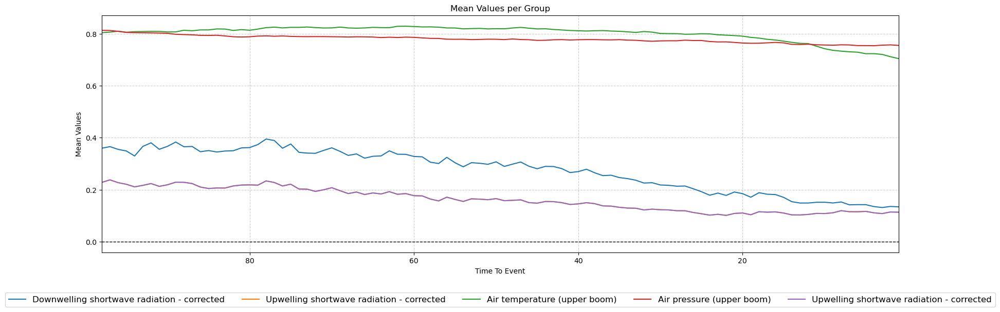

,Downwelling shortwave radiation - corrected,Upwelling shortwave radiation - corrected,Air temperature (upper boom),Air pressure (upper boom),Upwelling shortwave radiation - corrected
time_to_event,,,,,
0.0,0.120721,0.104376,0.700612,0.755140,0.104376
1.0,0.133986,0.113546,0.704331,0.754887,0.113546
2.0,0.135729,0.114381,0.711574,0.757121,0.114381
3.0,0.131439,0.108179,0.720358,0.755979,0.108179
4.0,0.135107,0.111074,0.723294,0.753874,0.111074
...,...,...,...,...,...
94.0,0.329678,0.210955,0.807821,0.804284,0.210955
95.0,0.348937,0.220850,0.805784,0.804953,0.220850
96.0,0.355082,0.227176,0.809673,0.809121,0.227176


In [50]:
# Group X_test by day of the year


df_group = df.groupby('time_to_event').filter(lambda x: len(x) > 80)
#if period == 'start':
#    X_set = X_set.loc[X_set['time_to_event'] < 160]
#elif period == 'end':  
#    X_set = X_set.loc[X_set['time_to_event'] > 160]
columns = ['Downwelling shortwave radiation - corrected','Upwelling shortwave radiation - corrected','Air temperature (upper boom)','Air pressure (upper boom)','Upwelling shortwave radiation - corrected']


grouped = df_group.groupby('time_to_event')[columns].mean()
display

# Plot
ax = grouped.plot(kind='line', figsize=(20, 6))
ax.axhline(y=0, color='black', linestyle='--', linewidth=1)
plt.xlabel('Time To Event')
plt.ylabel('Mean Values')
plt.title('Mean Values per Group')

# Assuming that 'time_to_event' is a numerical column, the following line sets the limit of x-axis
ax.set_xlim(1, grouped.index.max())
plt.gca().invert_xaxis()
ax.grid(True, linestyle='--', alpha=0.6)

# Move the legend underneath the plot
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=6, fontsize=12)

# Display the plot
plt.show()

display(grouped)


In [27]:
display(df.columns)
columns = ['Downwelling shortwave radiation - corrected','Air pressure (upper boom)','Air temperature (upper boom)','year_encoded','station_encoded','Albedo']
df.drop(['stid','Datetime','Melting Season','DayOfYear','Year',''])

Index(['stid', 'Datetime', 'Air pressure (upper boom)',
       'Air temperature (upper boom)',
       'Relative humidity (upper boom) - corrected',
       'Specific humidity (upper boom)', 'Wind speed (upper boom)',
       'Downwelling shortwave radiation - corrected',
       'Upwelling shortwave radiation - corrected',
       'Downwelling longwave radiation', 'Upwelling longwave radiation',
       'Surface temperature', 'Latent heat flux (upper boom)',
       'Sensible heat flux (upper boom)', 'Albedo', 'Cloud cover', 'Ablation',
       'Melting Season', 'DayOfYear', 'Year', 'event', 'event_True',
       'time_to_event', 'Wind from direction (upper boom)_sin',
       'Wind from direction (upper boom)_cos'],
      dtype='object')

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


[ 2  4 10 15 11  9  3  1  8 14 12 13  7 16  0  6  5]


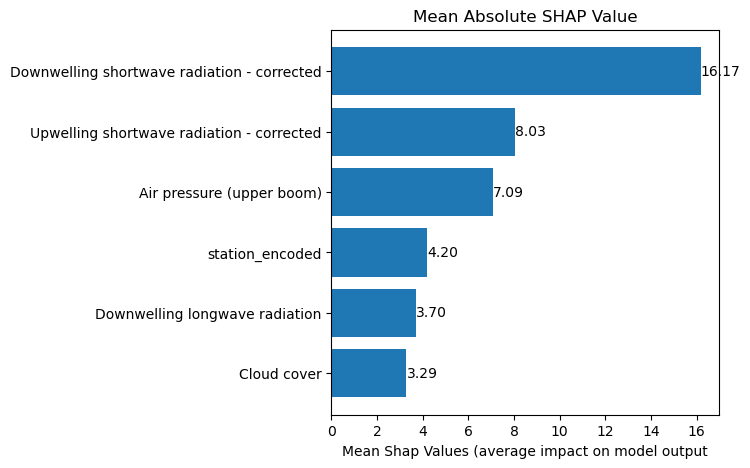

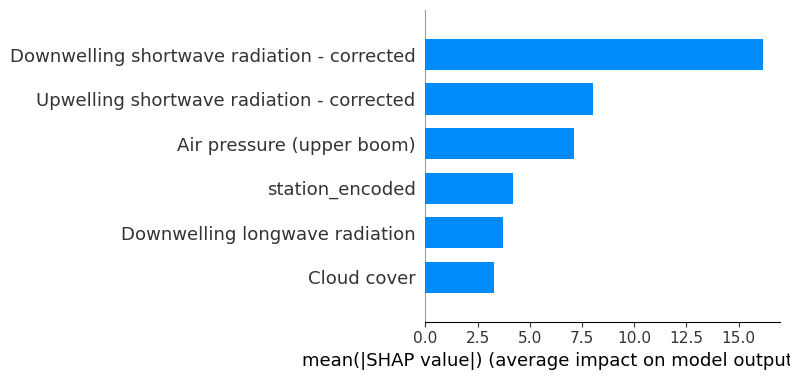

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


[ 2  4 15 10 11  3  9  8 14  1 12 13  7 16  6  0  5]


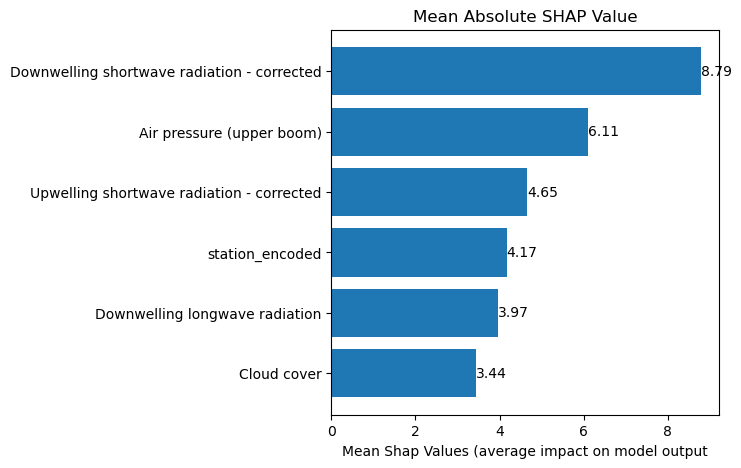

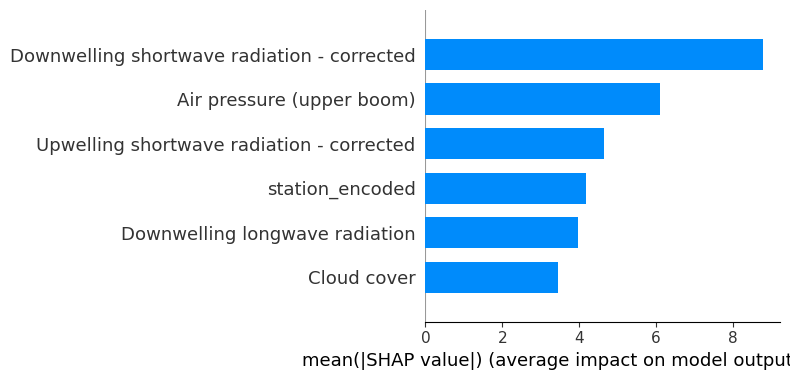

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


[15  4  2 11  3 10  9 14 12 16 13  1  8  7  6  0  5]


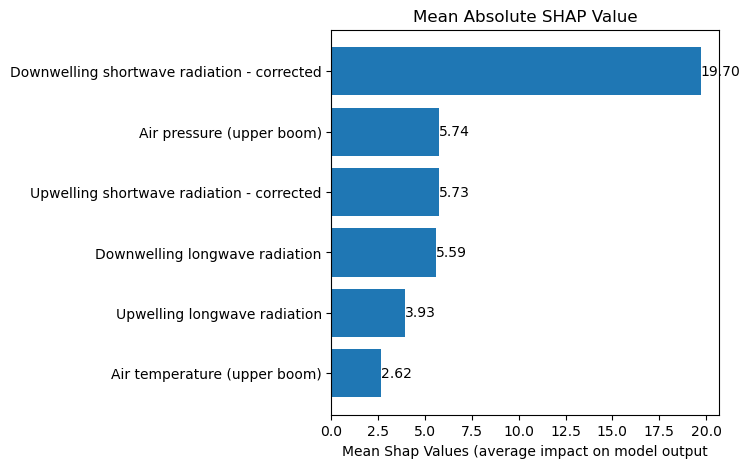

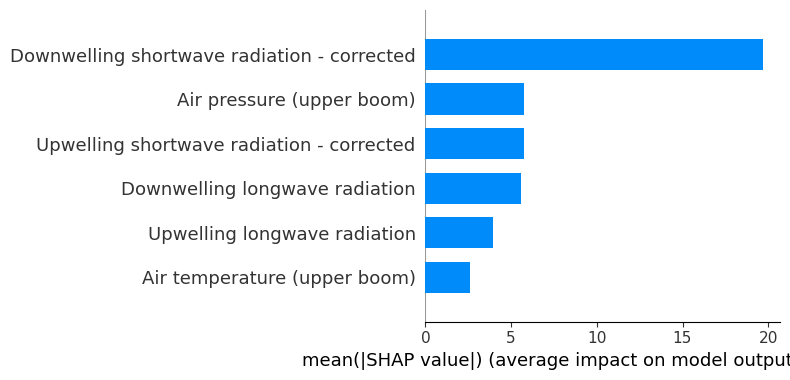

In [369]:
for i in range(len(X_sets)):

    X_set_week = pd.concat([X_sets[i][0], X_sets[i][1]])
    #X_set = X_sets[i][1]
    X = X_set_week
    shap_values_week = explainer(X)



    positive_color = "#ca0020"
    negative_color = "#92c5de"

    feature_importance(X_set, shap_values_week, max_display=6)
    # Plot the SHAP summary plot using the shap.summary_plot() function for the subset of interest
    shap.summary_plot(shap_values_week, X, plot_type='bar', max_display=6)

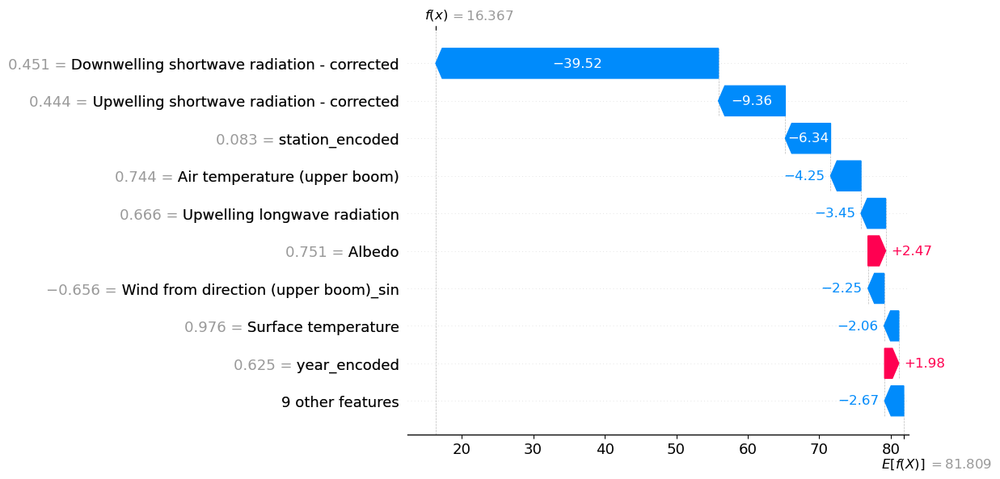

In [125]:
shap.plots.waterfall(shap_values[0])

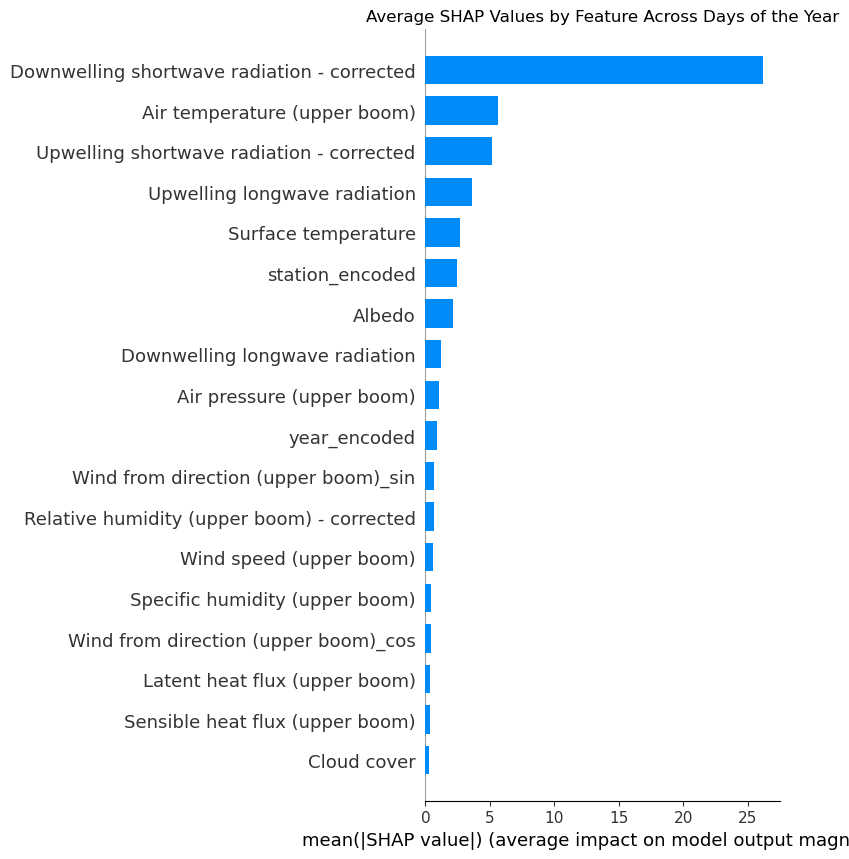

In [161]:
# Create a summary plot using the average SHAP values
plt.figure()
shap.summary_plot(average_shap_values, group.drop(columns=['DayOfYear']), plot_type='bar', max_display=20, show=False)
plt.title('Average SHAP Values by Feature Across Days of the Year')
plt.tight_layout()
plt.show()

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


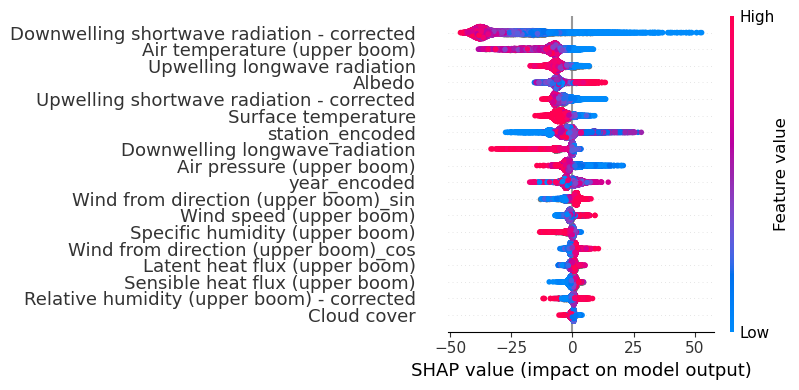

In [134]:
shap.summary_plot(shap_values, X, plot_type="dot", plot_size = (8,4))

,importance sum,importance lag max
Downwelling shortwave radiation - corrected,0.331724,0.331724
Upwelling shortwave radiation - corrected,0.172414,0.172414
Latent heat flux (upper boom),0.098671,0.098671
Surface temperature,0.078610,0.078610
Upwelling longwave radiation,0.050758,0.050758
Air pressure (upper boom),0.044477,0.044477
Wind speed (upper boom),0.036186,0.036186
Air temperature (upper boom),0.034971,0.034971
Wind from direction (upper boom),0.033938,0.033938
station_encoded,0.028941,0.028941


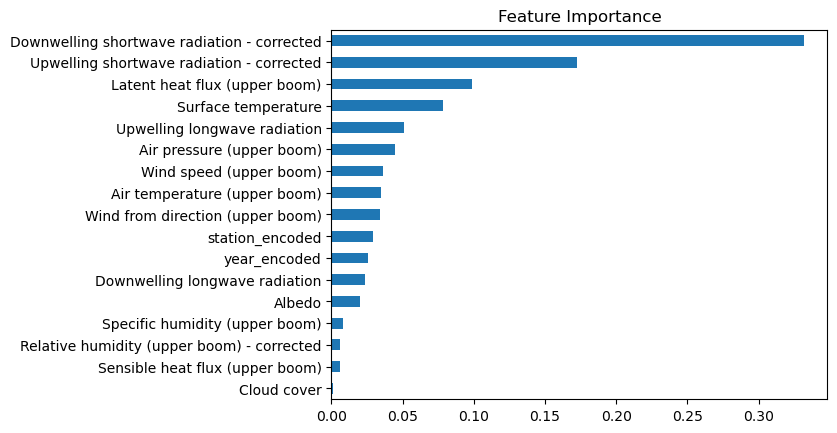

,importance sum,importance lag max
Downwelling shortwave radiation - corrected,0.331724,0.331724
Upwelling shortwave radiation - corrected,0.172414,0.172414
Latent heat flux (upper boom),0.098671,0.098671
Surface temperature,0.078610,0.078610
Upwelling longwave radiation,0.050758,0.050758
Air pressure (upper boom),0.044477,0.044477
Wind speed (upper boom),0.036186,0.036186
Air temperature (upper boom),0.034971,0.034971
Wind from direction (upper boom),0.033938,0.033938
station_encoded,0.028941,0.028941


In [299]:

f1 = pd.DataFrame(data=xgb_model.feature_importances_,
        index=xgb_model.feature_names_in_,
        columns=['Importance'])

feature_importance_agg = pd.DataFrame()
feature_importance_agg['importance sum'] = f1.groupby(lambda x: x.split('_lag')[0]).sum().sort_values(by='Importance', ascending=False)
feature_importance_agg['importance lag max'] = f1.groupby(lambda x: x.split('_lag')[0]).max()

import re

feature_importance_agg['importance sum'] = f1.groupby(lambda x: x.split('_lag')[0]).sum().sort_values(by='Importance', ascending=False)
feature_importance_agg['importance lag max'] = f1.groupby(lambda x: x.split('_lag')[0]).max()

def extract_lag_number(x):
    match = re.search(r'_lag_(\d+)', x)
    #if not match:
    #    print(f'No match found for: {x}')
    return int(match.group(1)) if match else 0

max_lag_importance = f1.groupby(lambda x: x.split('_lag')[0]).idxmax().applymap(extract_lag_number)

display(feature_importance_agg)


feature_importance_agg['importance sum'].sort_values(ascending=True).plot(kind='barh',title='Feature Importance')
plt.show()
display(feature_importance_agg)

In [267]:
#display(results)
summary = results_summary(df, results, 'KAN_L')
display(summary)

,Monthly,Quarterly,Yearly,event_date,,Month_diff,Quarter_diff,Year_diff
Datetime,,,,,,,,
2012-01-31,134.8,,,132.0,|,2.8,,
2012-02-29,143.2,,,132.0,|,11.2,,
2012-03-31,145.4,141.1,,132.0,|,13.4,9.1,
2012-04-30,144.8,,,132.0,|,12.8,,
2012-05-31,152.2,,,132.0,|,20.2,,
2012-06-30,,146.8,,132.0,|,,14.8,
2012-12-31,,,142.9,132.0,|,,,10.9
2014-01-31,138.9,,,143.0,|,-4.1,,
2014-02-28,147.4,,,143.0,|,4.4,,


# Calculating melt season end
-------------------------------------


In [268]:
df, features, target = preprocessing_melt(data, start_end='end',lags=7)
X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, method='by_year')


xgb_model = xgb.XGBRegressor(
   objective='reg:squarederror',
   max_depth=3,
   min_child_weight=5,
   learning_rate=0.01,
   n_estimators=400,
   subsample=0.5,
   colsample_bytree=0.8,
   reg_alpha=0.5,
   reg_lambda=0.5,
   early_stopping_rounds=20)




#xgb_model.fit(X_train, y_train['time_to_event'])

xgb_model.fit(X_train, y_train['time_to_event'],
        eval_set=[(X_train, y_train['time_to_event']),(X_test,y_test['time_to_event'])],
        verbose=10)

xgb_pred_train = xgb_model.predict(X_train)
xgb_pred_test = xgb_model.predict(X_test)

print("XGBoost MAE - Train:", mean_absolute_error(y_train['time_to_event'], xgb_pred_train))
print("XGBoost MAE - Test:", mean_absolute_error(y_test['time_to_event'], xgb_pred_test))
print("XGBoost MSE - Train:", mean_squared_error(y_train['time_to_event'], xgb_pred_train))
print("XGBoost MSE - Test:", mean_squared_error(y_test['time_to_event'], xgb_pred_test))
print("XGBoost R2 - Train:", r2_score(y_train['time_to_event'], xgb_pred_train))
print("XGBoost R2 - Test:", r2_score(y_test['time_to_event'], xgb_pred_test))



[0]	validation_0-rmse:63.79560	validation_1-rmse:66.67603
[10]	validation_0-rmse:58.65399	validation_1-rmse:61.59692
[20]	validation_0-rmse:54.07153	validation_1-rmse:57.05194
[30]	validation_0-rmse:49.98255	validation_1-rmse:52.96617
[40]	validation_0-rmse:46.33775	validation_1-rmse:49.31496
[50]	validation_0-rmse:43.07342	validation_1-rmse:46.01540
[60]	validation_0-rmse:40.17668	validation_1-rmse:43.07671
[70]	validation_0-rmse:37.61240	validation_1-rmse:40.44390
[80]	validation_0-rmse:35.31995	validation_1-rmse:38.06452
[90]	validation_0-rmse:33.30971	validation_1-rmse:35.97105
[100]	validation_0-rmse:31.51226	validation_1-rmse:34.07932
[110]	validation_0-rmse:29.94009	validation_1-rmse:32.38278
[120]	validation_0-rmse:28.54742	validation_1-rmse:30.86423
[130]	validation_0-rmse:27.32429	validation_1-rmse:29.51537
[140]	validation_0-rmse:26.24563	validation_1-rmse:28.32431
[150]	validation_0-rmse:25.31393	validation_1-rmse:27.28177
[160]	validation_0-rmse:24.47461	validation_1-rmse:

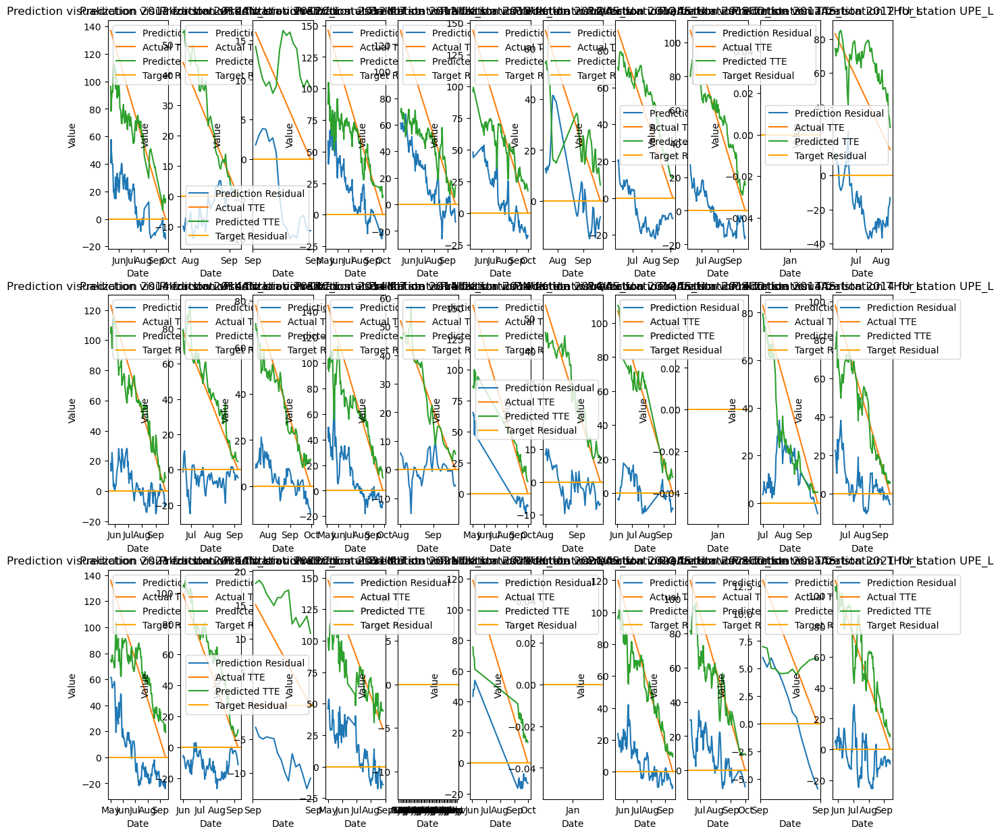

<Axes: title={'center': 'Feature Importance'}>

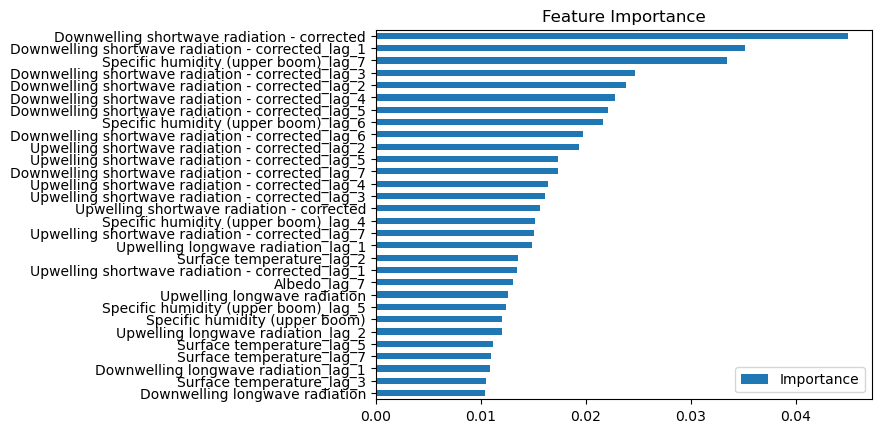

In [269]:
import matplotlib.dates as mdates

results = y_test['time_to_event'].to_frame()
results['xgb_pred'] = xgb_pred_test
results = results.sort_index()
#display(results)
results['diff'] = results['time_to_event'] - results['xgb_pred']

results[['Datetime','Year','stid','DayOfYear']] = df[['Datetime','Year','stid', 'DayOfYear']]
doy_group = df.groupby(['DayOfYear'])['time_to_event'].mean()
results = results.merge(doy_group, how='left',left_on='DayOfYear',right_on=doy_group.index).set_index(results.index)
results.rename(columns={'time_to_event_x':'time_to_event','time_to_event_y':'avg_time_to_event'},inplace=True)


sample_years = sorted(np.unique(results['Year']))
stations = results['stid'].unique()

fig, axes = plt.subplots(len(sample_years), len(stations), figsize=(15, len(sample_years) * 5))

for row, sample_year in enumerate(sample_years):
        for col, station in enumerate(stations):
                ax = axes[row, col]
                df_year_station = results.loc[(results['Year'] == sample_year) & (results['stid'] == station)]
                

                ax.plot(df_year_station['Datetime'], df_year_station['diff'], label = 'Prediction Residual')
                ax.plot(df_year_station['Datetime'], df_year_station['time_to_event'], label = 'Actual TTE')
                ax.plot(df_year_station['Datetime'], df_year_station['xgb_pred'], label = 'Predicted TTE')
                #ax.plot(df_year_station['Datetime'], df_year_station['avg_time_to_event'], label = 'Avg TTE')

                ax.axhline(y=0, label='Target Residual', color='orange')
                ax.set_xlabel('Date')
                ax.set_ylabel('Value')
                ax.set_title(f'Prediction visualization {sample_year} for station {station}')
                ax.legend()
                        # Configure the x-axis to display only months
                ax.xaxis.set_major_locator(mdates.MonthLocator())
                ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
plt.show()


f1 = pd.DataFrame(data=xgb_model.feature_importances_,
        index=xgb_model.feature_names_in_,
        columns=['Importance'])
f1 = f1.loc[f1['Importance'] > 0.01]
f1.sort_values('Importance').plot(kind='barh',title='Feature Importance')




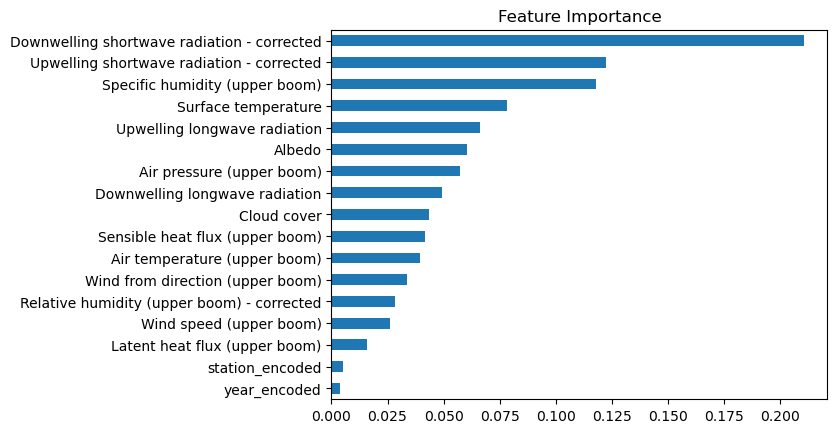

,importance sum,importance lag max,max_lag
Downwelling shortwave radiation - corrected,0.210566,0.044959,0
Upwelling shortwave radiation - corrected,0.122499,0.019322,2
Specific humidity (upper boom),0.117987,0.033478,7
Surface temperature,0.078309,0.013510,2
Upwelling longwave radiation,0.066151,0.014909,1
Albedo,0.060379,0.013069,7
Air pressure (upper boom),0.057462,0.009382,5
Downwelling longwave radiation,0.049270,0.010907,1
Cloud cover,0.043555,0.007710,0
Sensible heat flux (upper boom),0.041863,0.009118,2


In [270]:

f1 = pd.DataFrame(data=xgb_model.feature_importances_,
        index=xgb_model.feature_names_in_,
        columns=['Importance'])

#f1['feature'] = f1.index
#display(f1)


feature_importance_agg = pd.DataFrame()
feature_importance_agg['importance sum'] = f1.groupby(lambda x: x.split('_lag')[0]).sum().sort_values(by='Importance', ascending=False)
feature_importance_agg['importance lag max'] = f1.groupby(lambda x: x.split('_lag')[0]).max()

import re

feature_importance_agg['importance sum'] = f1.groupby(lambda x: x.split('_lag')[0]).sum().sort_values(by='Importance', ascending=False)
feature_importance_agg['importance lag max'] = f1.groupby(lambda x: x.split('_lag')[0]).max()

def extract_lag_number(x):
    match = re.search(r'_lag_(\d+)', x)
    #if not match:
    #    print(f'No match found for: {x}')
    return int(match.group(1)) if match else 0

max_lag_importance = f1.groupby(lambda x: x.split('_lag')[0]).idxmax().applymap(extract_lag_number)

feature_importance_agg['max_lag'] = max_lag_importance.iloc[:, 0]



feature_importance_agg['importance sum'].sort_values(ascending=True).plot(kind='barh',title='Feature Importance')
plt.show()
display(feature_importance_agg)


In [272]:
summary = results_summary(df, results, 'KAN_L')
display(summary)

,Monthly,Quarterly,Yearly,event_date,,Month_diff,Quarter_diff,Year_diff
Datetime,,,,,,,,
2012-05-31,239.7,,,269.0,|,-29.3,,
2012-06-30,242.9,241.5,,269.0,|,-26.1,-27.5,
2012-07-31,263.4,,,269.0,|,-5.6,,
2012-08-31,274.2,,,269.0,|,5.2,,
2012-09-30,276.9,268.5,,269.0,|,7.9,-0.5,
2012-12-31,,,255.4,269.0,|,,,-13.6
2014-05-31,253.1,,,266.0,|,-12.9,,
2014-06-30,248.0,249.2,,266.0,|,-18.0,-16.8,
2014-07-31,262.5,,,266.0,|,-3.5,,


# Survival analysis coxPHSurvival

In [337]:
df, features, target = preprocessing_melt(data, start_end='end',lags=False, exclude_nan=True)

print('len df', len(df))
print('len features', len(features))
print('len target', len(target))

display(features)
display(target)

68587
15239
len df 12587
len features 12587
len target 15239


,Air pressure (upper boom),Air temperature (upper boom),Relative humidity (upper boom) - corrected,Specific humidity (upper boom),Wind speed (upper boom),Downwelling shortwave radiation - corrected,Upwelling shortwave radiation - corrected,Downwelling longwave radiation,Upwelling longwave radiation,Surface temperature,Latent heat flux (upper boom),Sensible heat flux (upper boom),Albedo,Cloud cover,Wind from direction (upper boom)_cos,Wind from direction (upper boom)_sin,year_encoded,station_encoded
57348,0.745983,0.828432,0.807168,0.630000,0.128002,0.101019,0.072239,0.572517,0.699625,1.000000,0.636991,0.675426,0.542526,0.684958,-0.875693,0.482868,0.0625,0.0
57349,0.741579,0.805258,0.845475,0.606765,0.071780,0.125451,0.086803,0.585547,0.696639,1.000000,0.626050,0.656093,0.522396,0.808042,-0.653882,0.756597,0.0625,0.0
57350,0.739716,0.803366,0.750537,0.533870,0.084710,0.210911,0.158938,0.519253,0.694613,1.000000,0.613304,0.658293,0.565803,0.507583,-0.589147,0.808026,0.0625,0.0
57351,0.703764,0.803567,0.878215,0.636811,0.070406,0.062279,0.047505,0.614734,0.698678,1.000000,0.627532,0.656074,0.574304,0.945250,-0.615326,0.788273,0.0625,0.0
57358,0.720413,0.715827,0.706148,0.359359,0.053838,0.161159,0.165568,0.450497,0.650409,0.960912,0.614390,0.652699,0.775038,0.423417,-0.421484,0.906836,0.0625,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239929,0.672080,0.690172,0.739011,0.339857,0.170723,0.375429,0.356196,0.452404,0.633177,0.941904,0.596245,0.679292,0.701057,0.503889,-0.579467,0.814996,0.9375,1.0
239930,0.662983,0.700578,0.743010,0.467579,0.226745,0.104420,0.111722,0.294006,0.634805,0.984598,0.588504,0.663229,0.820332,0.211500,-0.680663,0.732597,0.9375,1.0
239931,0.645655,0.790187,0.877870,0.616004,0.123372,0.286052,0.265672,0.476280,0.695452,1.000000,0.626787,0.662951,0.687469,0.654250,-0.689345,0.724433,0.9375,1.0
239932,0.673420,0.780242,0.845527,0.530740,0.176495,0.259397,0.213302,0.529896,0.690001,0.998027,0.572563,0.675213,0.621708,0.630800,-0.914992,0.403473,0.9375,1.0


,event,event_True,time_to_event
57348,0,True,17.0
57349,0,True,16.0
57350,0,True,15.0
57351,0,True,14.0
57358,0,True,7.0
...,...,...,...
239956,0,True,4.0
239957,0,True,3.0
239958,0,True,2.0
239959,0,True,1.0


All Stations: (0.7980411848519952, 5654690, 1431022, 0, 0)
KAN_L c-index: 0.7863471841152765
KPC_L c-index: 0.8366461190086804
MIT c-index: 0.7368730522725936
NUK_L c-index: 0.7937910504181827
NUK_U c-index: 0.7342111054060001
QAS_L c-index: 0.8112749532597552
QAS_U c-index: 0.6549375709421112
SCO_L c-index: 0.84058658394329
SCO_U c-index: 0.8571342237263553
TAS_L c-index: 0.8120164609053498
THU_L c-index: 0.8369958275382475
UPE_L c-index: 0.8268268268268268
UPE_U c-index: 0.7815185237357374


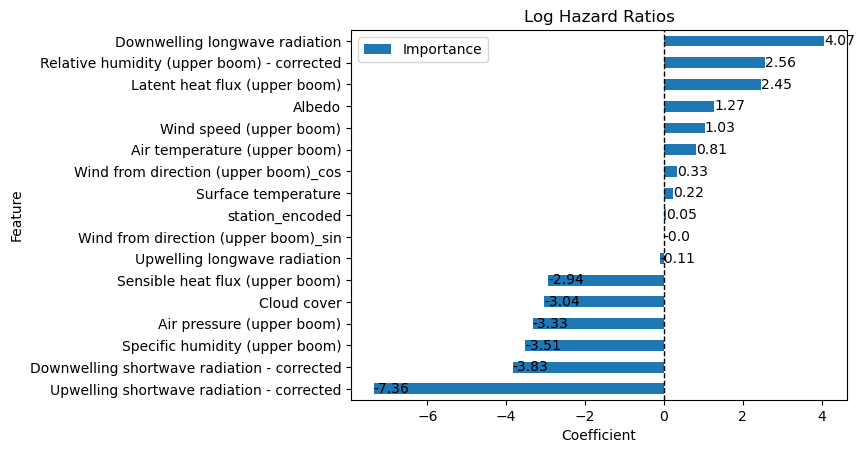

In [53]:
pd.options.mode.chained_assignment = None  # default='warn'


from sksurv.linear_model import CoxPHSurvivalAnalysis
from sksurv.util import Surv
from sksurv.metrics import cumulative_dynamic_auc
from sksurv.metrics import concordance_index_censored

df, features, target = preprocessing_melt(data, start_end='end',lags=False, exclude_nan=True)

X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, method='standard_train_test')
X_train.drop('year_encoded', axis=1, inplace=True)
X_test.drop('year_encoded', axis=1, inplace=True)

# Split the data into features (covariates) and the target variables (event and time_to_event)
covariates = X_train  
time_to_event = y_train['time_to_event']
event = y_train['event_True']
# Create a structured array for the target variables
y = Surv.from_arrays(event, time_to_event)
y_t = Surv.from_arrays(y_test['event_True'], y_test['time_to_event'])
#[0.1, 0.5, 0.7, 1.0],


# Fit the Cox proportional hazards model
coxph = CoxPHSurvivalAnalysis(alpha=0.7)
coxph.fit(X_train, y)

# Print the model coefficients
#print("Model coefficients:", coxph.coef_)

time_to_event_test = y_test['time_to_event']
event_test = y_test['event_True'].astype('bool')


prediction = coxph.predict(X_test)

result = concordance_index_censored(event_test, time_to_event_test, prediction)
print(f'All Stations: {result}')


stations = df['stid'].unique() 

for station in stations:
    #station_index = df.loc[df['stid'] == station].index.intersection(X_train.index)
    #covariates = X_train.loc[station_index]
    #y = Surv.from_arrays(y_train.loc[station_index,'event_True'],y_train.loc[station_index,'time_to_event'])
    #coxph.fit(covariates, y)

    station_index = df.loc[df['stid'] == station].index.intersection(y_test.index)
    time_to_event_test_station = time_to_event_test.loc[station_index]
    event_test_station = event_test.loc[station_index]
    X_test_station = X_test.loc[station_index]
    prediction_station = coxph.predict(X_test_station)
    station_result = concordance_index_censored(event_test_station, time_to_event_test_station, prediction_station)
    print(f'{station} c-index: {station_result[0]}')


#print("C-index:", result[0])
f1 = pd.DataFrame(data=coxph.coef_,
        index=X_train.columns,
        columns=['Importance']).sort_values(by='Importance',ascending=False)

ax = f1.sort_values('Importance').plot(kind='barh', title='Log Hazard Ratios')
ax.set_xlabel('Coefficient')
ax.set_ylabel('Feature')
ax.axvline(x=0, color='black', linestyle='--', linewidth=1)

# Add data labels
for i, v in enumerate(f1['Importance'].sort_values()):
    ax.text(v, i, str(round(v, 2)), color='black', ha='left', va='center')

plt.show()



In [ ]:
# Get the estimated survival functions for the test dataset
predicted_survival = coxph.predict_survival_function(X_test)
#display(predicted_survival)

plt.figure(figsize=(10, 6))
for i, surv_func in enumerate(predicted_survival[:10]):  # Change this to plot more or fewer curves
    plt.step(surv_func.x, surv_func.y, where="post", label=f"Subject {i}")

plt.xlabel('Time')
plt.ylabel('Survival Probability')
plt.title('Predicted Survival Functions for Melt Season Start and End')
plt.legend(loc='upper right')
plt.show()

# Calculate time-dependent AUC
times = np.percentile(y_test['time_to_event'], np.linspace(5, 95, 5))
auc, mean_auc = cumulative_dynamic_auc(y, y_t, prediction, times)

# Plot time-dependent ROC curve
plt.figure(figsize=(10, 6))
plt.plot(times, auc, marker='o', color='blue')
plt.xlabel('Time')
plt.ylabel('AUC')
plt.title('Time-Dependent ROC Curve')
plt.show()


# Forest plot
def plot_forest_plot(data, y_labels, title='Forest Plot'):
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.errorbar(data['HR'], np.arange(len(y_labels)), xerr=[data['HR'] - data['CI_lower'], data['CI_upper'] - data['HR']],
                fmt='o', color='black', capsize=3, elinewidth=1, markeredgewidth=1)
    ax.axvline(x=1, linestyle='--', color='gray', linewidth=1)
    ax.set_yticks(np.arange(len(y_labels)))
    ax.set_yticklabels(y_labels)
    ax.set_xlabel('Hazard Ratio (95% CI)')
    ax.set_title(title)
    ax.invert_yaxis()
    plt.show()

# Prepare the forest plot data
def get_confidence_intervals(model, alpha=0.05):
    se = np.sqrt(np.diag(model.variance_matrix_))
    z_score = -norm.ppf(alpha / 2)
    ci_lower = model.coef_ - z_score * se
    ci_upper = model.coef_ + z_score * se
    return ci_lower, ci_upper

# Prepare the forest plot data
ci_lower, ci_upper = get_confidence_intervals(coxph)
forest_plot_data = pd.DataFrame({'HR': np.exp(coxph.coef_), 'CI_lower': np.exp(ci_lower), 'CI_upper': np.exp(ci_upper)},
                                index=features.columns)

# Create the forest plot
plot_forest_plot(forest_plot_data, features.columns)

# Plot time-dependent ROC curve
plt.figure(figsize=(10, 6))
plt.plot(times, auc, marker='o', color='blue')
plt.xlabel('Time')
plt.ylabel('AUC')
plt.title('Time-Dependent ROC Curve')
plt.show()


# Survival analysis coxPHSurvival melt end date

68587
24670
C-index: 0.8062099256246147


<Axes: title={'center': 'Feature Importance'}>

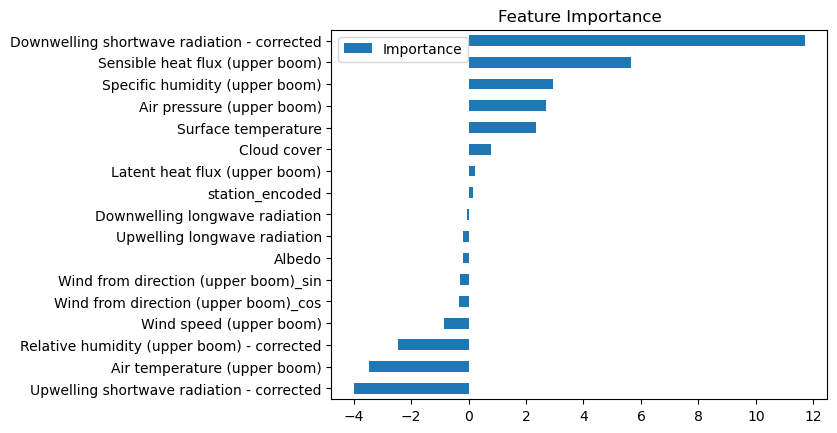

In [260]:
from sksurv.linear_model import CoxPHSurvivalAnalysis
from sksurv.util import Surv
from sksurv.metrics import cumulative_dynamic_auc
from sksurv.metrics import concordance_index_censored

df, features, target = preprocessing_melt(data, start_end='start',lags=False, exclude_nan=True)
X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, method='standard_train_test')
X_train.drop('year_encoded', axis=1, inplace=True)
X_test.drop('year_encoded', axis=1, inplace=True)
# Split the data into features (covariates) and the target variables (event and time_to_event)
covariates = X_train  
time_to_event = y_train['time_to_event']
event = y_train['event_True']

# Create a structured array for the target variables
y = Surv.from_arrays(event, time_to_event)

#[0.1, 0.5, 0.7, 1.0],

# Fit the Cox proportional hazards model
coxph = CoxPHSurvivalAnalysis(alpha=0.1)
coxph.fit(X_train, y)

# Print the model coefficients
#print("Model coefficients:", coxph.coef_)

time_to_event_test = y_test['time_to_event']
event_test = y_test['event_True'].astype('bool')

prediction = coxph.predict(X_test)
result = concordance_index_censored(event_test, time_to_event_test, prediction)
print("C-index:", result[0])

f1 = pd.DataFrame(data=coxph.coef_,
        index=X_train.columns,
        columns=['Importance']).sort_values(by='Importance',ascending=False)
#display(f1)

f1.sort_values('Importance').plot(kind='barh',title='Feature Importance')

# Make predictions on new data (if applicable)
# new_data = pd.DataFrame(...)  # Create a DataFrame with the same structure as 'covariates'
# predicted_survival = coxph.predict_survival_function(new_data)


# Survival Analysis Random Forrest

## Melt season start

Int64Index([2021, 2018, 2015], dtype='int64', name='Year')
0.8392852382007793


,Importance
Downwelling shortwave radiation - corrected,0.494808
station_encoded,0.201964
Albedo,0.044722
Upwelling shortwave radiation - corrected,0.044673
Surface temperature,0.043142
Air pressure (upper boom),0.039337
year_encoded,0.031866
Wind from direction (upper boom)_sin,0.018615
Relative humidity (upper boom) - corrected,0.016257
Air temperature (upper boom),0.015297


<Axes: title={'center': 'Feature Importance'}>

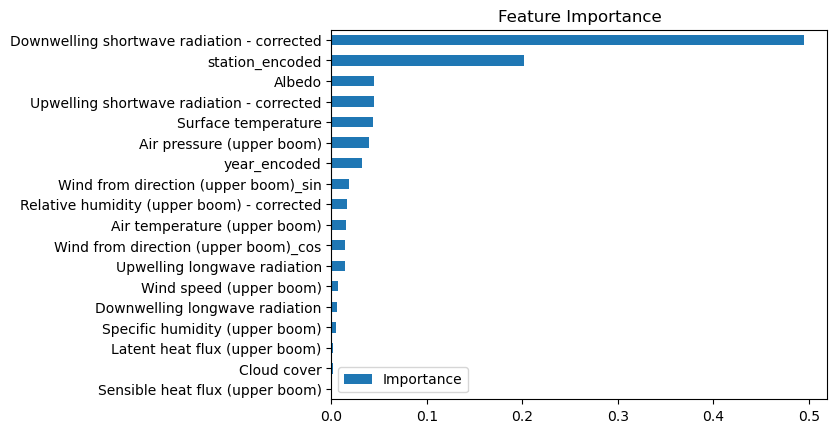

In [346]:
from sksurv.ensemble import GradientBoostingSurvivalAnalysis
from sksurv.metrics import concordance_index_censored

df, features, target = preprocessing_melt(data, start_end='start',lags=False, exclude_nan=True)
X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target,method='standard_train_test')

y_train_array = y_train[['event_True','time_to_event']].to_records(index=False)

gbsa = GradientBoostingSurvivalAnalysis(
    learning_rate=0.1,
    max_depth=3,
    n_estimators=100,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=42)
gbsa.fit(X_train, y_train_array)

# Make predictions
prediction = gbsa.predict(X_test)

# Compute the concordance index
result = concordance_index_censored(y_test['event_True'], y_test['time_to_event'], prediction)
print(result[0])

f1 = pd.DataFrame(data=gbsa.feature_importances_,
        index=features.columns,
        columns=['Importance']).sort_values(by='Importance',ascending=False)
display(f1)

f1.sort_values('Importance').plot(kind='barh',title='Feature Importance')

In [361]:
test = pd.DataFrame()
test[['event','time_to_event']] = y_test[['event','time_to_event']]
test['result'] = prediction

display(test.iloc[270:350].tail(30))


,event,time_to_event,result
3239,0,20.0,2.563155
3240,0,19.0,2.709328
3241,0,18.0,2.893399
3242,0,17.0,3.228808
3243,0,16.0,3.461294
3244,0,15.0,3.585402
3245,0,14.0,3.620280
3246,0,13.0,3.761090
3247,0,12.0,3.737856
3248,0,11.0,3.468291


# Survival gradient end

In [344]:
from sksurv.ensemble import GradientBoostingSurvivalAnalysis
from sksurv.metrics import concordance_index_censored

df, features, target = preprocessing_melt(data, start_end='end',lags=False)
X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, method='by_year')


y_train_array = y_train[['event_True','time_to_event']].to_records(index=False)

gbsa = GradientBoostingSurvivalAnalysis(
    learning_rate=0.1,
        max_depth=5,
        n_estimators=50,
        min_samples_split=2,
        min_samples_leaf=3,
        random_state=42)

gbsa.fit(X_train, y_train_array)

# Make predictions
prediction = gbsa.predict(X_test)

# Compute the concordance index
result = concordance_index_censored(y_test['event_True'], y_test['time_to_event'], prediction)
print("C-index:", result[0])

f1 = pd.DataFrame(data=gbsa.feature_importances_,
        index=features.columns,
        columns=['Importance']).sort_values(by='Importance',ascending=False)
display(f1)

f1.sort_values('Importance').plot(kind='barh',title='Feature Importance')

Int64Index([2017, 2012, 2021, 2013], dtype='int64', name='Year')


ValueError: Input X contains NaN.
GradientBoostingSurvivalAnalysis does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

# XGB Regressor Gridsearch
_________________________________
## Melt Season Start

In [293]:
# start melt season gridsearch
from sklearn.model_selection import KFold


df, features, target = preprocessing_melt(data, start_end='start',lags=7)
#X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, by_year=True)


# Create TimeSeriesSplit object
cv = KFold(n_splits=3, shuffle=False)#, random_state=42)

# Define the XGBRegressor model
xgb_model = xgb.XGBRegressor()

# Define the parameter grid for the grid search
param_grid = {
    'learning_rate': [0.01], #, 0.1],
    'max_depth': [3, 5], #, 7],
    'n_estimators': [200, 300, 400], # 100,
    'subsample': [0.8, 1.0], #0.5,
    'colsample_bytree': [0.8, 1.0], #, 0.5],
    'reg_alpha': [0.5, 1.0],
    'reg_lambda': [0.5, 1.0],
    'min_child_weight':[3, 5] # 1
}

# Set up the grid search with TimeSeriesSplit for cross-validation
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='neg_mean_absolute_error',
    cv=cv,
    verbose=3,
    n_jobs=-1
)

# Fit the grid search to the data
grid_search.fit(features, target['time_to_event'])

# Print the best parameters and corresponding score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

rmse = np.sqrt(np.abs(grid_search.best_score_))
print("Best RMSE:", rmse)

Fitting 3 folds for each of 192 candidates, totalling 576 fits
Best parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 200, 'reg_alpha': 0.5, 'reg_lambda': 1.0, 'subsample': 1.0}
Best score: -29.719380881545977
Best RMSE: 5.451548484746877


In [294]:
# Print the best parameters and corresponding score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

rmse = np.sqrt(np.abs(grid_search.best_score_))
print("Best RMSE:", rmse)

Best parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 200, 'reg_alpha': 0.5, 'reg_lambda': 1.0, 'subsample': 1.0}
Best score: -29.719380881545977
Best RMSE: 5.451548484746877


In [9]:
# start melt season gridsearch
from sklearn.model_selection import KFold


df, features, target = preprocessing_melt(data, start_end='start',lags=7)
#X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, by_year=True)


# Create TimeSeriesSplit object
cv = KFold(n_splits=3, shuffle=False)#, random_state=42)

# Define the XGBRegressor model
xgb_model = xgb.XGBRegressor()

# Define the parameter grid for the grid search
param_grid = {
    'learning_rate': [0.01], #, 0.1],
    'max_depth': [3, 5], #, 7],
    'n_estimators': [200, 300, 400], # 100,
    'subsample': [0.8, 1.0], #0.5,
    'colsample_bytree': [0.8, 1.0], #, 0.5],
    'reg_alpha': [0.5, 1.0],
    'reg_lambda': [0.5, 1.0],
    'min_child_weight':[3, 5] # 1
}

# Set up the grid search with TimeSeriesSplit for cross-validation
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='explained_variance',
    cv=cv,
    verbose=3,
    n_jobs=-1
)

# Fit the grid search to the data
grid_search.fit(features, target['time_to_event'])

# Print the best parameters and corresponding score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

rmse = np.sqrt(np.abs(grid_search.best_score_))
print("Best RMSE:", rmse)

filtered out for station KPC_L max_year 2023 min_year 2008
filtered out for station SCO_L max_year 2023 min_year 2008
filtered out for station SCO_U max_year 2023 min_year 2008
Fitting 3 folds for each of 192 candidates, totalling 576 fits
Best parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 200, 'reg_alpha': 0.5, 'reg_lambda': 1.0, 'subsample': 0.8}
Best score: 0.6959975482942214
Best RMSE: 0.8342646752045908


In [10]:
# Print the best parameters and corresponding score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

rmse = np.sqrt(np.abs(grid_search.best_score_))
print("Best RMSE:", rmse)

Best parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 200, 'reg_alpha': 0.5, 'reg_lambda': 1.0, 'subsample': 0.8}
Best score: 0.6959975482942214
Best RMSE: 0.8342646752045908


## Melt Season End

In [105]:
# start melt season gridsearch

df, features, target = preprocessing_melt(data, start_end='end',lags=14)
#X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, by_year=True)


# Create TimeSeriesSplit object
tscv = TimeSeriesSplit(n_splits=3)

# Define the XGBRegressor model
xgb_model = xgb.XGBRegressor()

# Define the parameter grid for the grid search
param_grid = {
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200],
    'subsample': [0.5, 0.8, 1.0],
    'colsample_bytree': [0.5, 0.8, 1.0],
    'reg_alpha': [0.5, 1.0],
    'reg_lambda': [0.5, 1.0],
    'min_child_weight':[1, 3, 5]
}

# Set up the grid search with TimeSeriesSplit for cross-validation
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='neg_mean_squared_error', 
    cv=tscv,
    verbose=3,
    n_jobs=-1
)

# Fit the grid search to the data
grid_search.fit(features, target['time_to_event'])

# Print the best parameters and corresponding score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

rmse = np.sqrt(np.abs(grid_search.best_score_))
print("Best RMSE:", rmse)

Fitting 5 folds for each of 1296 candidates, totalling 6480 fits
Best parameters: {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 5, 'n_estimators': 200, 'reg_alpha': 0.5, 'reg_lambda': 1.0, 'subsample': 1.0}
Best score: -116.80159165204347
Best RMSE: 10.807478505740526


In [106]:
# Print the best parameters and corresponding score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

rmse = np.sqrt(np.abs(grid_search.best_score_))
print("Best RMSE:", rmse)

Best parameters: {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 5, 'n_estimators': 200, 'reg_alpha': 0.5, 'reg_lambda': 1.0, 'subsample': 1.0}
Best score: -116.80159165204347
Best RMSE: 10.807478505740526


# GradientBoostingSurvivalAnalysis gridsearch

## Melt season start

In [101]:
from sksurv.ensemble import GradientBoostingSurvivalAnalysis
from sksurv.metrics import concordance_index_censored
import itertools

df, features, target = preprocessing_melt(data, start_end='start',lags=False)
target = target[['event_True','time_to_event']]
X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, by_year=True)


y_train_array = y_train[['event_True','time_to_event']].to_records(index=False)


def manual_grid_search(X_train, y_train_array, X_test, y_test):
    learning_rates = [0.01, 0.1]
    max_depths = [3, 5]
    n_estimators = [50, 100]
    min_samples_splits = [2, 5]
    min_samples_leafs = [1, 3]

    best_hyperparameters = None
    best_c_index = -1

    for params in itertools.product(learning_rates, max_depths, n_estimators, min_samples_splits, min_samples_leafs):
        learning_rate, max_depth, n_estimator, min_samples_split, min_samples_leaf = params

        gbsa = GradientBoostingSurvivalAnalysis(
            learning_rate=learning_rate,
            max_depth=max_depth,
            n_estimators=n_estimator,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            random_state=42
        )

        gbsa.fit(X_train, y_train_array)
        predictions = gbsa.predict(X_test)
        c_index = concordance_index_censored(y_test['event_True'], y_test['time_to_event'], predictions)[0]

        #print('Learning_rate:', learning_rate)
        #print('max_depth:',max_depth)
        #print('n_estimators:',n_estimators)
        #print('min_samples_split',min_samples_split)
        #print('min_samples_leaf', min_samples_leaf)
        #print(c_index)

        if c_index > best_c_index:
            best_c_index = c_index
            best_hyperparameters = params

    return best_hyperparameters, best_c_index

# Usage example

best_params, best_c_index = manual_grid_search(X_train, y_train_array, X_test, y_test)
print("Best hyperparameters:", best_params)
print("Best C-index:", best_c_index)

Best hyperparameters: (0.1, 3, 100, 2, 1)
Best C-index: 0.9394051798370537


## Melt season end

In [100]:
df, features, target = preprocessing_melt(data, start_end='end',lags=False)
target = target[['event_True','time_to_event']]
X_train, X_test, y_train, y_test = custom_train_test_split(df, features, target, by_year=True)


y_train_array = y_train[['event_True','time_to_event']].to_records(index=False)


def manual_grid_search(X_train, y_train_array, X_test, y_test):
    learning_rates = [0.01, 0.1]
    max_depths = [3, 5]
    n_estimators = [50, 100]
    min_samples_splits = [2, 5]
    min_samples_leafs = [1, 3]

    best_hyperparameters = None
    best_c_index = -1

    for params in itertools.product(learning_rates, max_depths, n_estimators, min_samples_splits, min_samples_leafs):
        learning_rate, max_depth, n_estimator, min_samples_split, min_samples_leaf = params

        gbsa = GradientBoostingSurvivalAnalysis(
            learning_rate=learning_rate,
            max_depth=max_depth,
            n_estimators=n_estimator,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            random_state=42
        )

        gbsa.fit(X_train, y_train_array)
        predictions = gbsa.predict(X_test)
        c_index = concordance_index_censored(y_test['event_True'], y_test['time_to_event'], predictions)[0]

        #print('Learning_rate:', learning_rate)
        #print('max_depth:',max_depth)
        #print('n_estimators:',n_estimators)
        #print('min_samples_split',min_samples_split)
        #print('min_samples_leaf', min_samples_leaf)
        #print(c_index)

        if c_index > best_c_index:
            best_c_index = c_index
            best_hyperparameters = params

    return best_hyperparameters, best_c_index

# Usage example

best_params, best_c_index = manual_grid_search(X_train, y_train_array, X_test, y_test)
print("Best hyperparameters:", best_params)
print("Best C-index:", best_c_index)

Best hyperparameters: (0.1, 5, 50, 2, 3)
Best C-index: 0.885528472888119


Month
1          NaN
2          NaN
3     0.795062
4     0.764239
5     0.724837
6     0.542907
7     0.401691
8     0.440204
9     0.586213
10         NaN
11         NaN
12         NaN
Name: Albedo, dtype: float64